#Notebook : Epidemic spreading on complex networks ✅

Monte Carlo simulation of an epidemic spreading dynamics in complex networks, using the SIS model in which each node represents an individual which can be in two possible states: Susceptible (S), i.e., healthy but can get infected; Infected (I), i.e., has the disease and can spread it to its neighbors.

We are interested in the calculation of the fraction of infected nodes, ρ, in the stationary state, as a function of the infection probability of the disease β (at least 51 values between β=0 and β=1, Δβ=0.02), for different values of the recovery probability μ (e.g. 0.1, 0.5, 0.9). Try different undirected networks (e.g., Erdös-Rényi, scale-free, real), different sizes (at least 500 nodes), average degrees, exponents, etc. Do not make all the combinations, about 10 plots ρ(β) are enough.

Optionally (but mandatory if you want to opt to the maximum grade), compare the ρ(β) result from Monte Carlo simulations with the theoretical prediction provided by the Microscopic Markov Chain Approach (MMCA) model.




In [1]:
!pip install powerlaw

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Importing all the libraries ✅

In [2]:
import networkx as nx
import time
import numpy as np
import random as rd
import matplotlib.pyplot as plt
from itertools import combinations
import powerlaw
from scipy import stats
import copy
import pandas as pd
import time
import random

%matplotlib inline

In [5]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


#Developing the functions SIS, MC ad MCCA ✅

###SIS : Susceptible-Infected-Susceptible

The Monte Carlo simulation requires some extra parameters:
• Nrep: number of repetitions of the simulation.
• ρ(0): initial fraction of infected nodes.
• Tmax: maximum number of time steps of each simulation.
• Ttrans: number of steps of the transitory.

In [3]:
Nrep = 100
p_0 = 0.2 
Tmax = 1000
Ttrans = 900

The SIS (Susceptible-Infected-Susceptible), as explained in the documentation, models the spread of a disease inside a network. 

The function we developed therefore takes the parameters u (the likelihood of recovery) and b (the probability of propagation) together with the network graph G as input. With a given initial probability of infection, p_0, the model initializes a set of susceptible nodes and infected nodes. 

The model then modifies each node's state based on the likelihood of recovery or transmission at each time step. With the option of plotting the infection's progression over time, the simulation runs for a predetermined number of time steps. 

The final probability p that a node will be infected at any given time step is the function's output after the system has reached a stationary state. 

In [4]:
def SIS(G,u,b, plot_time=False):

    sus = set(G.nodes)
    N = len(sus)
    inf = set()
    n_p_0 = round(p_0 * len(sus))
    inf_0 = set(rd.sample(sus, n_p_0))
    inf = inf | inf_0
    sus = sus - inf_0
    P = 0
    p_t=[0,]
    for t in range(0,Tmax):
        new_sus = set() 
        new_inf = set() 
        for i in inf:
            if rd.random() < u:
                new_sus.add(i)
        for s in sus:
            for n in G.neighbors(s):
                if n in inf and rd.random() < b:
                    new_inf.add(s) 
                    break
        sus = (sus | new_sus) - new_inf
        inf = (inf | new_inf) - new_sus
        if len(sus)+len(inf) != N:
            print('Error: #S + #I must be = N')
            return
        if plot_time == True:
            inf_len = len(inf)
            p_t.append(inf_len/N)
        if t>=Ttrans:
            P+=len(inf)
    p = P/(N*(Tmax-Ttrans))
    if plot_time == True:
        plt.figure(figsize=(10,6))
        plt.title(f'N = {N}, u = {u}, b = {b}')
        plt.plot(p_t)
        
    return p

Here is just an another function SIS2 we developed. It is similar to the first one but with more parameters. We used them both to test the results but we will be stikcing with the first function developed. 

In [6]:
def SIS2(graph, recovery_rate, infection_rate, plot_time=False, initial_infected_frac=0.1, transient_period=0):
    susceptible_nodes = set(graph.nodes())
    num_nodes = len(susceptible_nodes)
    infected_nodes = set(random.sample(susceptible_nodes, round(initial_infected_frac*num_nodes)))
    susceptible_nodes -= infected_nodes
    time_steps = range(transient_period, Tmax)
    infected_count = [len(infected_nodes)/num_nodes] if plot_time else None
    p = 0
    
    for t in range(Tmax):
        new_susceptible = set()
        new_infected = set()
        for node in infected_nodes:
            if random.random() < recovery_rate:
                new_susceptible.add(node)
        for node in susceptible_nodes:
            neighbors = graph.neighbors(node)
            if any(neighbor in infected_nodes and random.random() < infection_rate for neighbor in neighbors):
                new_infected.add(node)
        susceptible_nodes = (susceptible_nodes | new_susceptible) - new_infected
        infected_nodes = (infected_nodes | new_infected) - new_susceptible
        if len(susceptible_nodes) + len(infected_nodes) != num_nodes:
            raise ValueError("Error: #S + #I must be = N")
        if plot_time and t in time_steps:
            infected_count.append(len(infected_nodes)/num_nodes)
        if t >= transient_period:
            p += len(infected_nodes)
    
    p /= num_nodes*(Tmax-transient_period)
    
    if plot_time:
        plt.plot(infected_count)
        plt.title(f"SIS model: N={num_nodes}, u={recovery_rate}, b={infection_rate}")
        plt.xlabel("Time")
        plt.ylabel("Fraction of Infected Nodes")
        plt.show()
        
    return p


###MC : Monte Carlo Simulation 

The MC function will be using the first SIS function developed. In fact, using the Susceptible-Infected-Susceptible (SIS) model, our code will be able to run Monte Carlo simulations to determine the number of cases somehow (p) of an infectious disease in a network. By calling the SIS function with a defined number of repetitions Nrep, transmission rate b, and recovery rate u for the network G, the function MC we developed will be able to execute repeated runs of the SIS model. 

Then finally, a calculation is made and the result is the average p across all scenarios.

We then added the function plots to be able to plot the MC Simulation following the u_list we will be giving him. The standard list is [0.1, 0.5, 0.7]. Sometimes when the computations are less (number of nodes <<), we may use a bigger u_list.




In [9]:
def MC(G, Nrep, u, b):
    sum_p = 0
    for i in range(0,Nrep):
        sum_p += SIS(G, u, b)
    return sum_p/Nrep

b_arr = np.linspace(0, 1.0, num=51)

def plots(G, name, u_list=[0.1, 0.5, 0.9]):
    fig, ax = plt.subplots(figsize=(10,6))
    plt.title(name)
    ax.set_ylim([0, 1])
    plt.grid()
    dict_={}
    for u in u_list:
        p_list_ = []
        for b in b_arr:
            p = MC(G, Nrep, u, b)
            p_list_.append(p)
        ax.plot(b_arr, p_list_, '-o', markersize=3, label = 'u = {}'.format(u))
        dict_[u]=p_list_
    plt.xlabel('b')
    plt.ylabel('<p>')
    plt.legend()
    plt.savefig('plot_'+name)
    
    return dict_

### MMCA Prediction : Microscopic Markov Chain Approach 

The function MMCA Prediction implements the Microscopic Markov Chain Approach (MMCA) model, which predicts the average number of infected nodes in a network given the recovery rate and infection probability. 

The input network G, recovery rate u, infection probability b, and the initial fraction of infected nodes p_0 are the four parameters that the MMCA_prediction function requires. 

After 500 time steps of network iteration, the function updates the percentage of infected nodes according to the MMCA model. It also uses its latest 100 values to determine the average percentage of infected nodes in the oscillatory regime if a cycle is observed. Alsom the time series' latest 100 values are used if no cycle is found.

The function then returns either the last 100 values of the time series or the mean of the oscillatory regime, depending on which seems more suitable.


In [10]:
def MMCA_prediction(G,u,b,p_0):
    nodes = G.nodes
    N = len(nodes)
    p = [p_0]*N
    p_time = [p_0,]
    cycle_found=False
    for t in range(500):
        q = [1]*N
        for i in nodes:
            for j in G.neighbors(i):

                q[i] *= 1 - b * p[j]
        for i in nodes:
            p[i] = (1-p[i])*(1-q[i])+(1-u)*p[i]
        p_mean = np.mean(p)
        if p_mean in p_time:
            cycle_found = True
            break
        p_time.append(p_mean)
    
    if cycle_found:
        for i in range(len(p_time)):
            if p_time[i]==p_mean:
                osc_p_mean = p_time[i:]
    else: 

        osc_p_mean = p_time[-100:]
    mean_osc = np.mean(osc_p_mean)
    return mean_osc

For this part, a network G and a list of infection probabilities u_list, which by default is set to [0.1, 0.5, 0.9], are inputs to the function. 

First of all, the function creates a blank dictionary called dict_. It then iterates through each value of u in the u_list.

We then iterate through the values of b in b_arr, a numpy array of values from 0 to 1 with a total of 51 values, within this loop once for each value of u. 

The function then will be able to call MMCA_prediction with the values of u, b, and p_0 for each combination of u and b and adds the resultant mean oscillation value to a list p_list_. For each value of u, this method is performed for all b values in b_arr. And this is exactly what we mean by combination. (we often use two lists to get all the possible combinations)

Finally, a key-value pair with the u value as the key and a list of mean oscillation values for all b values for the adequate u in question is added to the dictionary dict_. 

The dictionary dict_ is then returned by the function. 




In [ ]:
def MMCA_combinations(G, u_list=[0.1, 0.5, 0.9]):
    dict_ = {}
    for u in u_list:
        p_list_ = []
        for b in b_arr:
            p = MMCA_prediction(G,u,b,p_0)
            p_list_.append(p)
        dict_[u] = p_list_
    return dict_

###Comparison MC & MMCA

In [12]:
def plot_comparison(simulation, prediction, u_list, name):
    fig, ax = plt.subplots(figsize=(10,6))
    ax.set_ylim([0, 1])
    plt.xlabel('b')
    plt.ylabel('<p>')
    plt.title(f'Comparison between MC and MMCA: {name}')
    simulation_data = []
    for u in u_list:
        plt.plot(b_arr,simulation[u], label='simulated, u = {}'.format(u))
        plt.plot(b_arr,prediction[u],'o', label='predicted, u = {}'.format(u))
        for i, b in enumerate(b_arr):
            simulation_data.append({'u': u, 'b': b, 'simulation': simulation[u][i], 'prediction': prediction[u][i]})
    plt.legend()
    plt.grid()
    plt.savefig(f'/content/drive/MyDrive/A4_Networks/comparaison_{name}')
    df = pd.DataFrame(simulation_data)
    file_name = f"/content/drive/MyDrive/A4_Networks/data_{random.randint(1,10000)}.csv"
    df.to_csv(file_name, index=False)
    print (df)


###Generating the networks ER  & SF

We mainly used the same functions we used in the activity 2 to generate the graphs. We first used the ER_GNK with the parameters N and K. 

And we then used SF_Even and Configuration Models to generate the second type of graphs.  

####ER Networks

In [15]:
def ER_Gnk(N,K):
    G=nx.Graph()
    G.add_nodes_from([i for i in range(N)])
    n_edges=0
    while n_edges<K:
        edge=rd.choice(list(combinations(G,2)))
        if (edge[0],edge[1]) not in G.edges():
            G.add_edge(edge[0],edge[1])
            n_edges+=1
    return G

####Scale Free Distribution

In [ ]:
def SF_even(N, l):
    th=powerlaw.Power_Law(xmin=1.0, parameters = [l])
    th_gen=th.generate_random(N);
    node_degrees=list(np.floor(th_gen).astype(int))
    if np.sum(node_degrees)%2==1:
        node_degrees[0]+=1
    node_degrees=np.array(node_degrees)
    
    return node_degrees

####CM Networks

In [16]:
def CM(node_degrees): 
    if np.sum(node_degrees)%2==1:
        print('the sum of the node degrees must be even')
        return 
    G=nx.Graph()
    G.add_nodes_from([i for i in range(len(node_degrees))])
    v=[]
    for n,d in enumerate(node_degrees):
        for _ in range(d):
            v.append(n)
    rd.shuffle(v) 
    bad_edges=[]
    for i in range(0,len(v),2):
        if v[i]==v[i+1]: 
            bad_edges+=[v[i],v[i+1]]
        elif (v[i],v[i+1]) in G.edges(): 
            bad_edges+=[v[i],v[i+1]]
        else:
            G.add_edge(v[i],v[i+1])
    counter=0
    stop=10
    bad_edges_shuffled=bad_edges
    while len(bad_edges)!=0 and counter<stop:
        rd.shuffle(bad_edges_shuffled)
        bad_edges=[]
        for i in range(0,len(bad_edges_shuffled),2):
            if bad_edges_shuffled[i]==bad_edges_shuffled[i+1]:
                bad_edges+=[bad_edges_shuffled[i],bad_edges_shuffled[i+1]]
            elif (bad_edges_shuffled[i],bad_edges_shuffled[i+1]) in G.edges():
                bad_edges+=[bad_edges_shuffled[i],bad_edges_shuffled[i+1]]
            else:
                G.add_edge(bad_edges_shuffled[i],bad_edges_shuffled[i+1])
            counter+=1
    return G


#Plotting the results *✅*

##ER Networks

###Network : ERP_500_5

In [13]:
N=500
avg_degree=5
K=N*(avg_degree)/2
ER_500_5 = ER_Gnk(N,K)
nx.write_pajek(ER_500_5, "/content/drive/MyDrive/A4_Networks/ERP_500_5.net")

####SIS Combinations

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-6-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


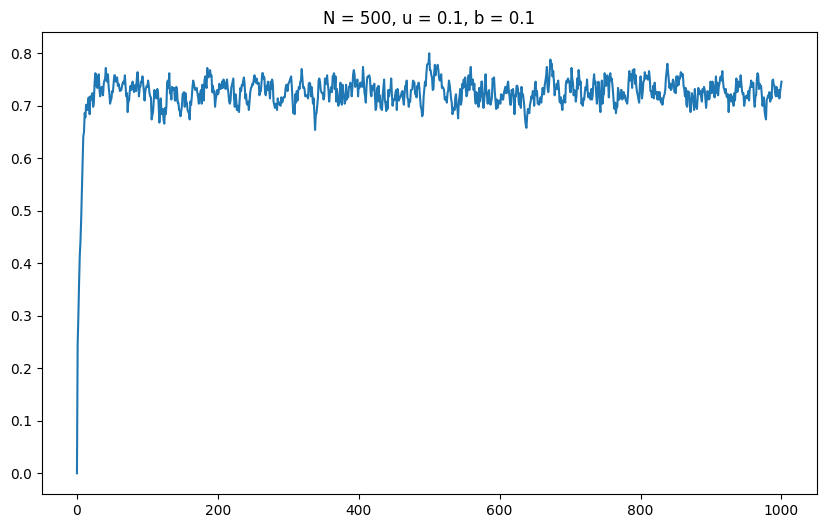

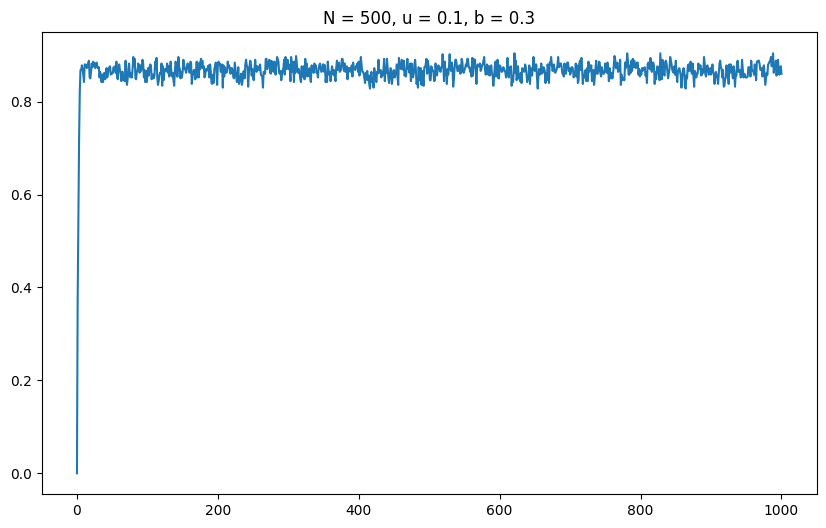

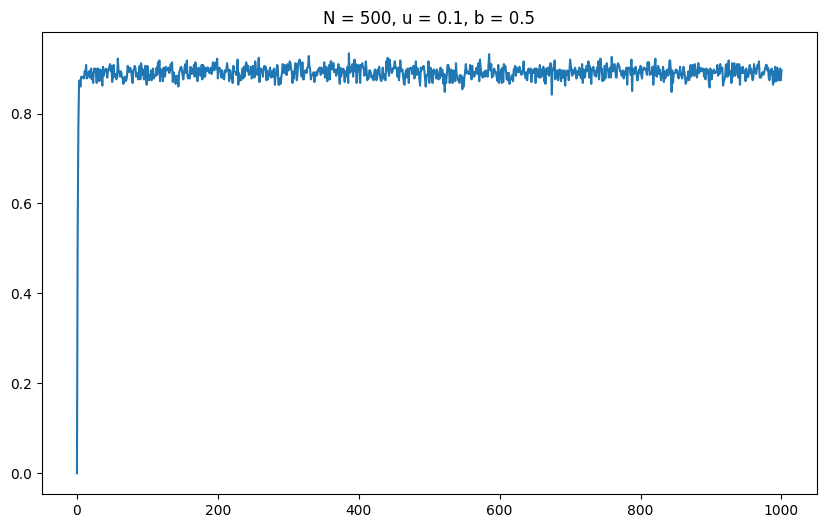

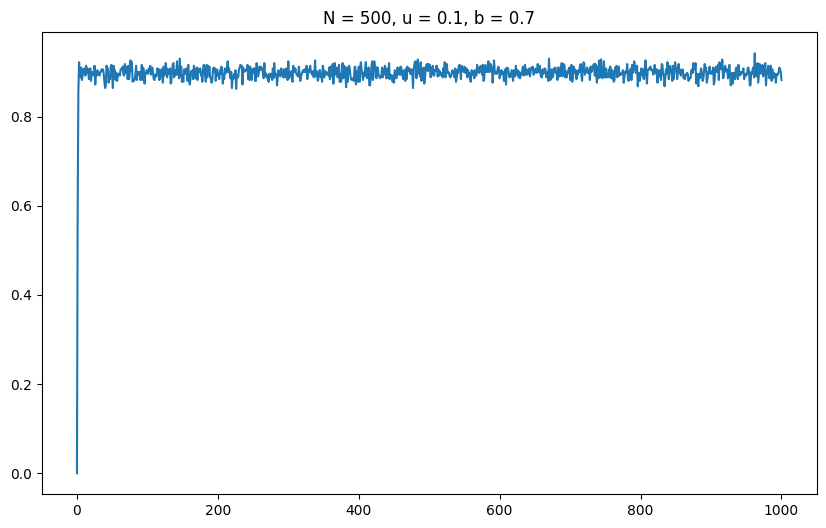

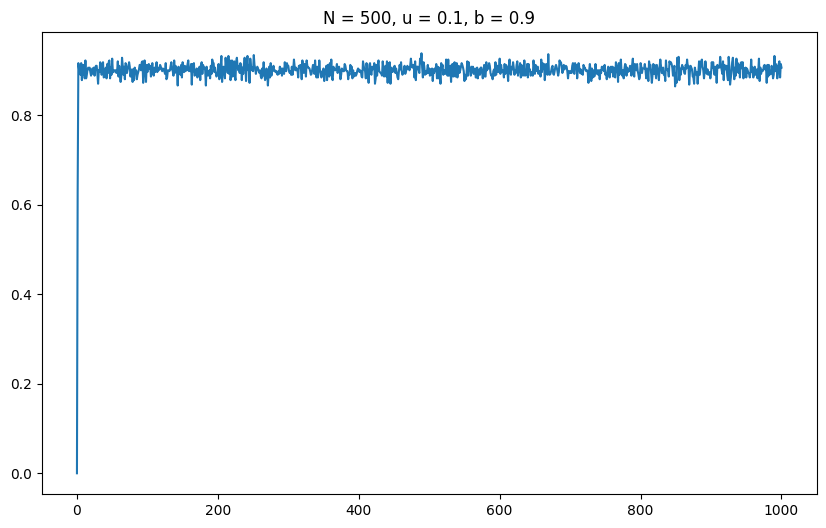

...

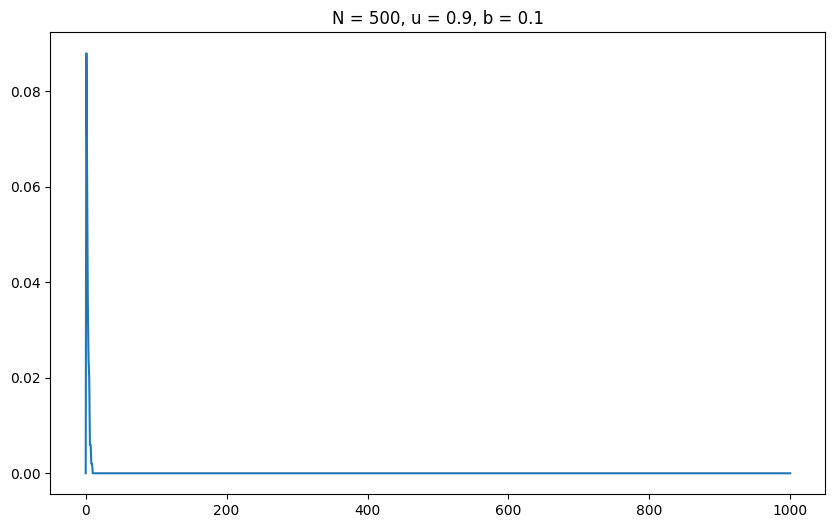

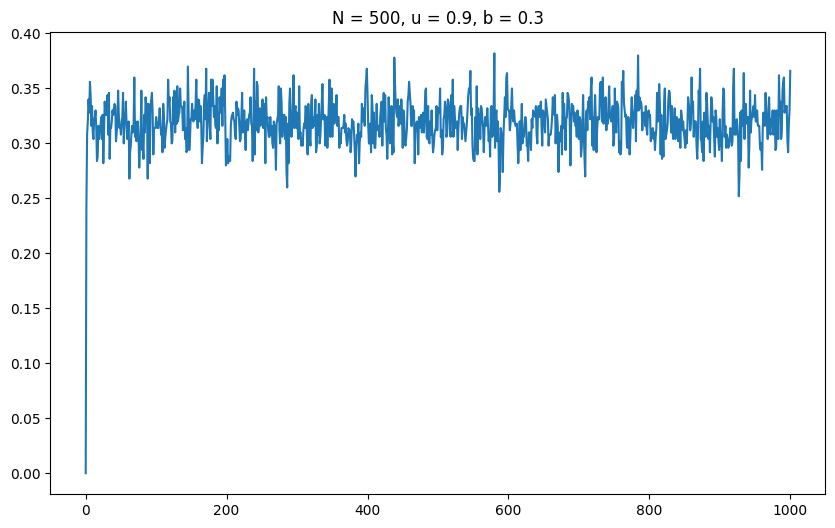

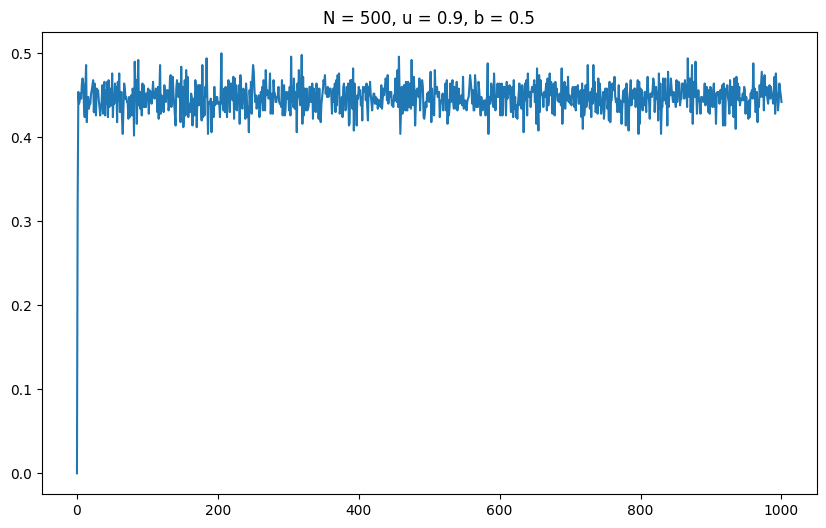

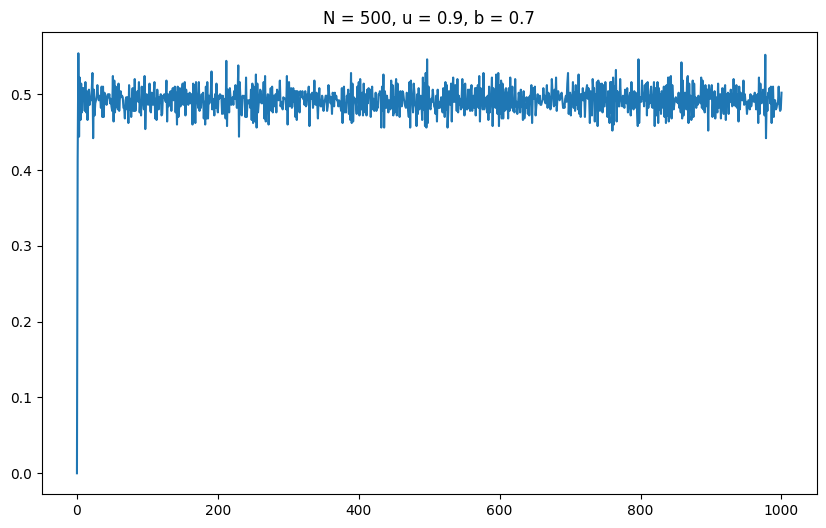

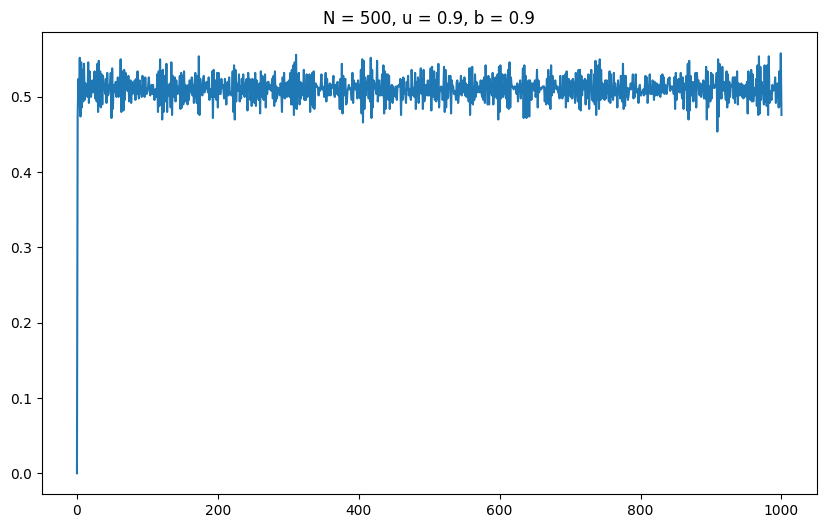

In [14]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(ER_500_5, u, b, plot_time=True)

In [30]:
u_list = [0.1, 0.5, 0.9]

####MC Simulation for the network

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


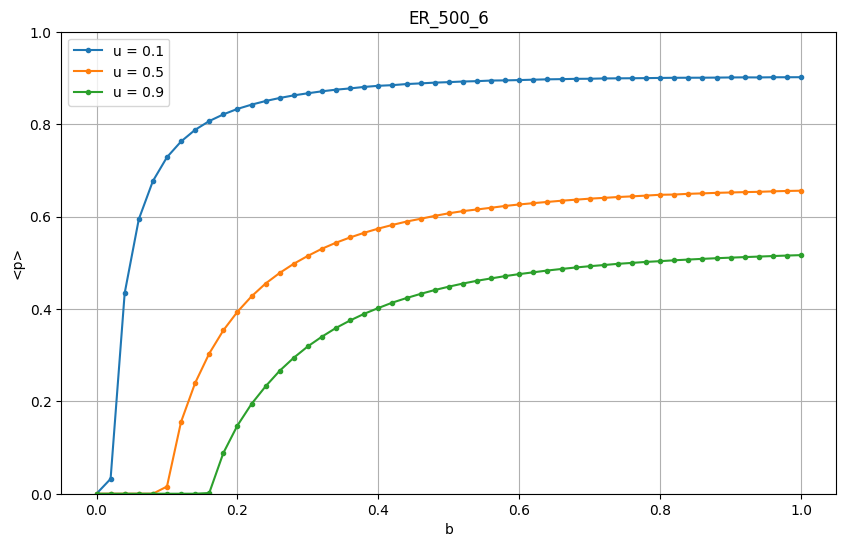

In [15]:
Ttrans = 200
Tmax = 300
Nrep = 100
dict_ER_500_5 = plots(ER_500_5,'ER_500_5')

####Comparison MC & MMCA

In [16]:
MMCA_ER_500_5 = MMCA_combinations(ER_500_5)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.032155  1.294760e-01
2    0.1  0.04    0.434273  4.724778e-01
3    0.1  0.06    0.593928  6.120648e-01
4    0.1  0.08    0.676649  6.876468e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.512175  4.971245e-01
149  0.9  0.94    0.513287  4.987046e-01
150  0.9  0.96    0.514435  5.001881e-01
151  0.9  0.98    0.515520  5.015798e-01
152  0.9  1.00    0.516466  5.028855e-01

[153 rows x 4 columns]


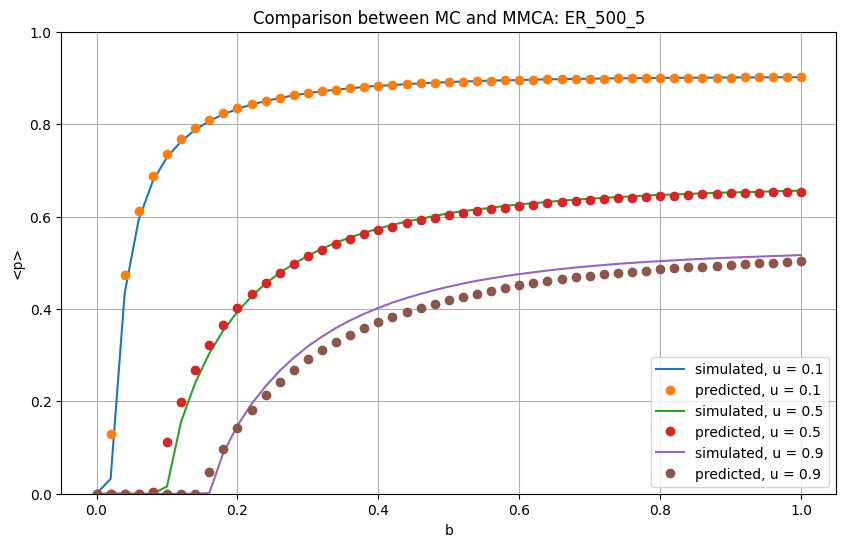

In [64]:
plot_comparison(dict_ER_500_5, MMCA_ER_500_5, u_list, 'ER_500_5')

###Network : ERP_2000_14

In [25]:
N=2000
avg_degree=14
K=N*(avg_degree)/2
ER_2000_14 = ER_Gnk(N,K)
nx.write_pajek(ER_2000_14, "/content/drive/MyDrive/A4_Networks/ER_2000_14.net")

####SIS Combinations

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-6-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


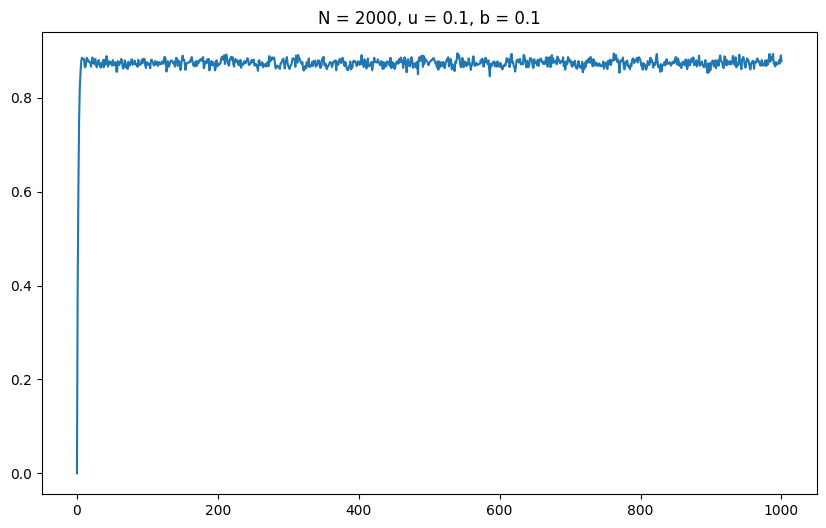

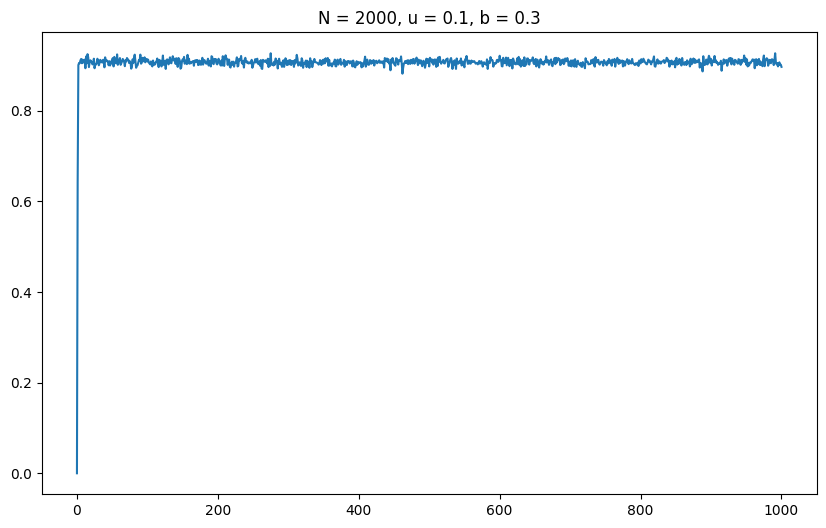

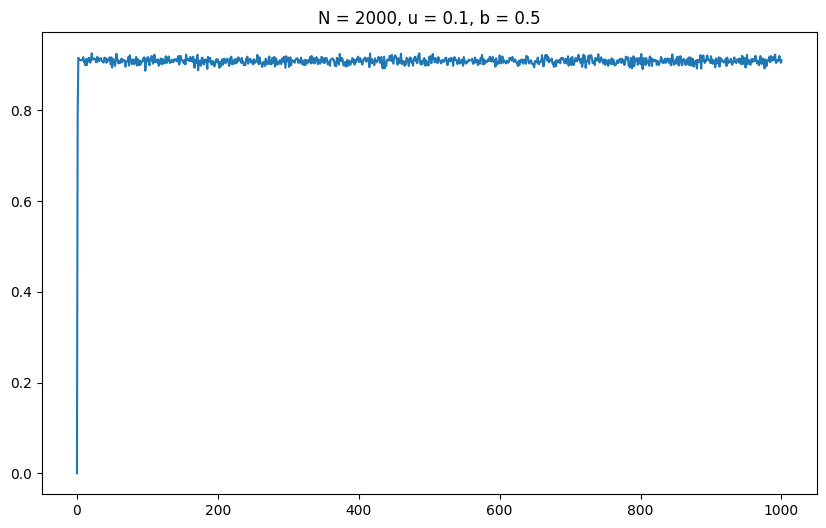

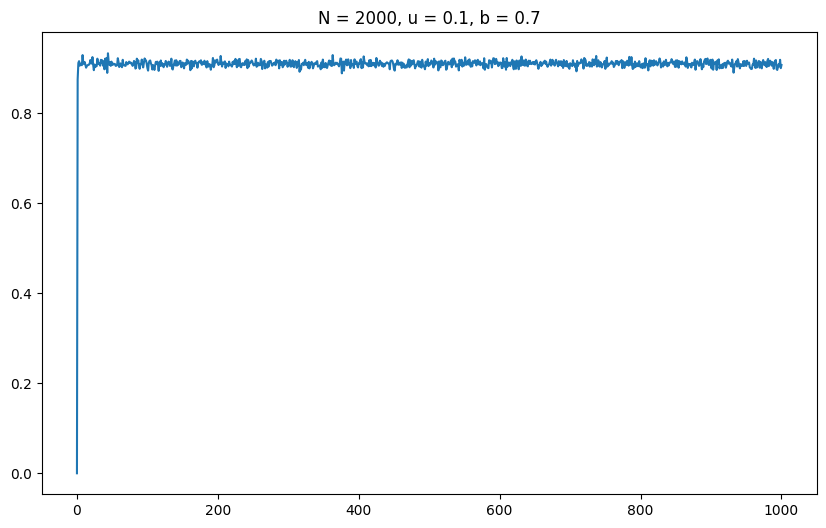

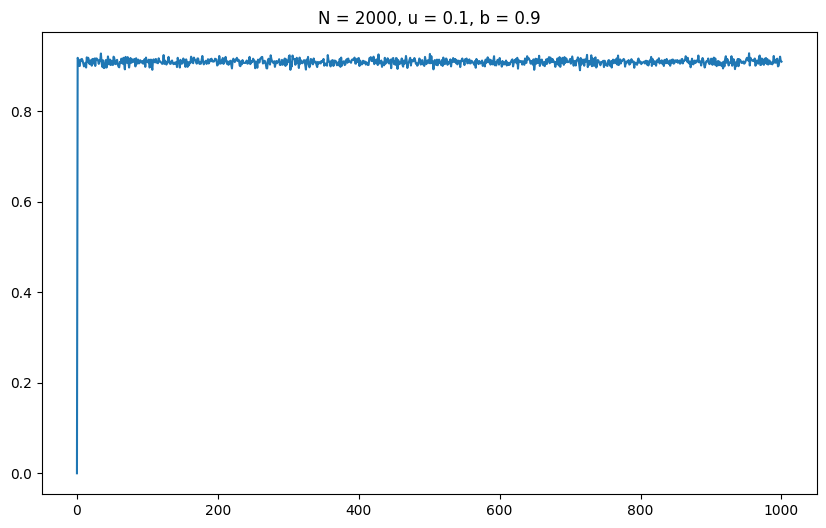

...

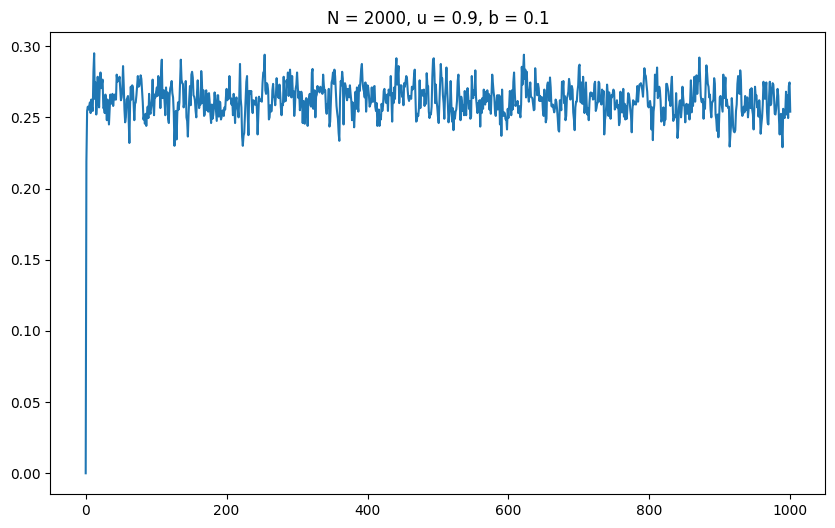

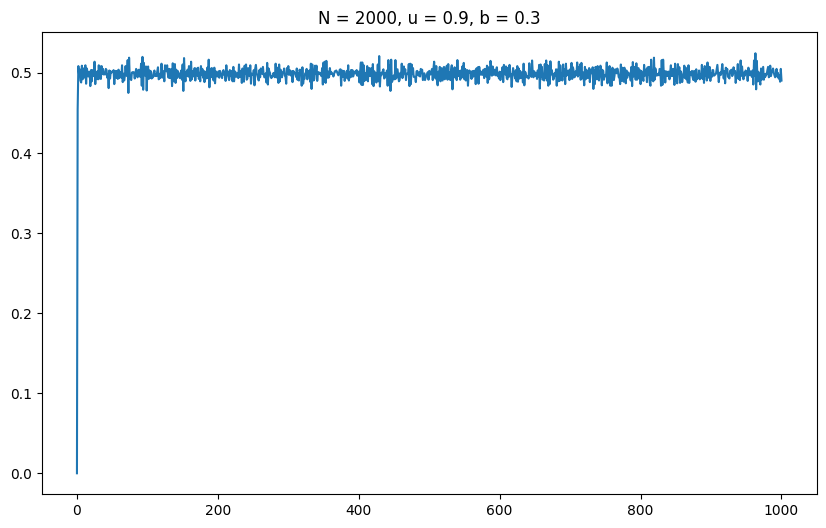

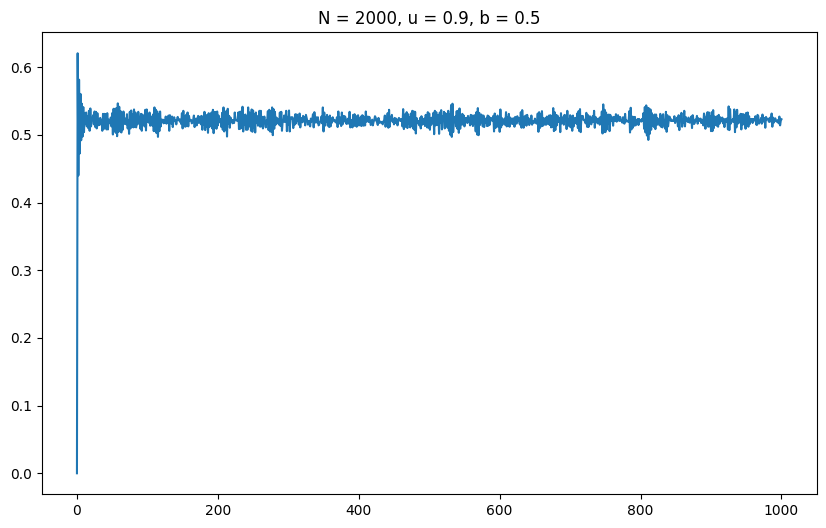

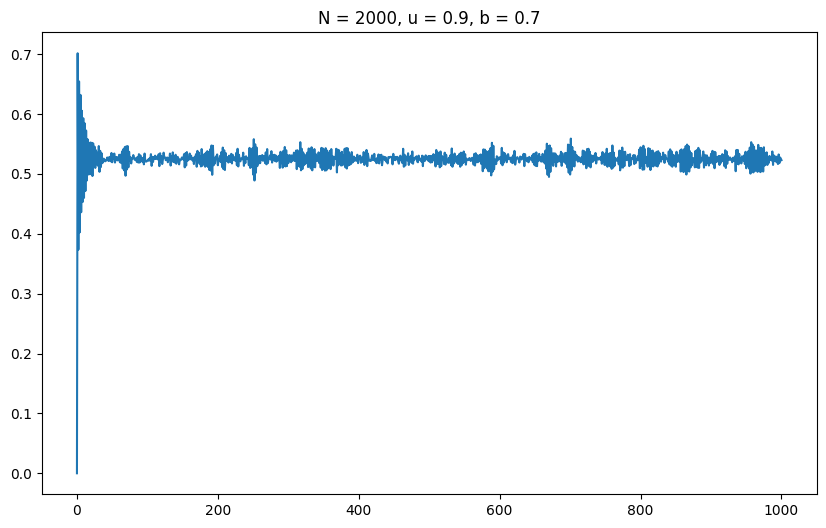

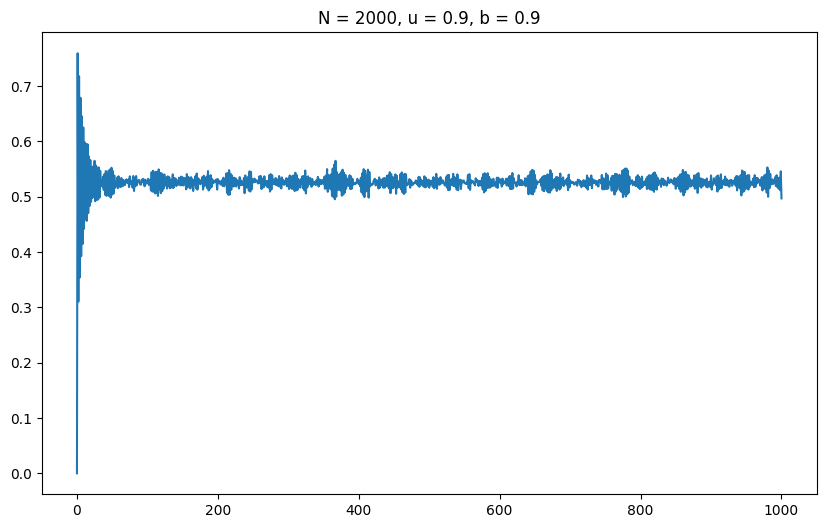

In [26]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(ER_2000_14, u, b, plot_time=True)

In [65]:
u_list = [0.1, 0.5, 0.9]

####MC Simulation for the network 

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


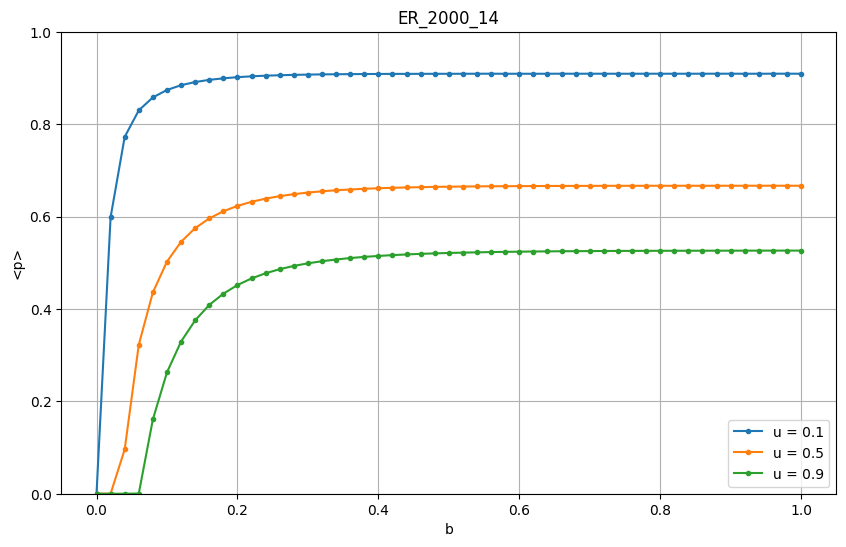

In [66]:
Ttrans = 100
Tmax = 300
Nrep = 100
dict_ER_2000_14 = plots(ER_2000_14,'ER_2000_14', u_list)

####Comparison MC & MMCA

In [67]:
MMCA_ER_2000_14 = MMCA_combinations(ER_2000_14)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.598500  6.059516e-01
2    0.1  0.04    0.772318  7.738418e-01
3    0.1  0.06    0.829766  8.304228e-01
4    0.1  0.08    0.857795  8.581387e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.526123  5.260256e-01
149  0.9  0.94    0.526172  5.260646e-01
150  0.9  0.96    0.526225  5.260983e-01
151  0.9  0.98    0.526215  5.261274e-01
152  0.9  1.00    0.526236  5.261526e-01

[153 rows x 4 columns]


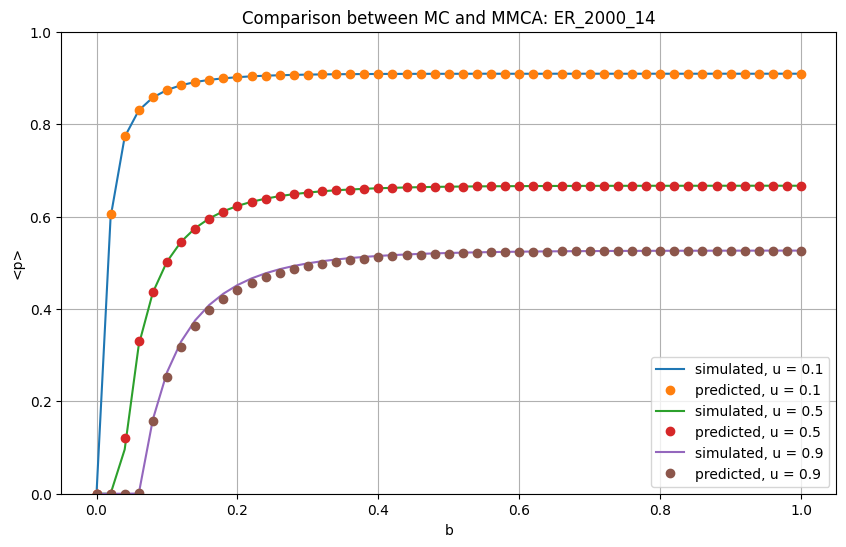

In [68]:
plot_comparison(dict_ER_2000_14, MMCA_ER_2000_14, u_list, 'ER_2000_14')

##SF Networks

###Network : CM_SF_500_21

In [69]:
N=500
gamma=2.1
node_degrees=SF_even(N, gamma)
CM_SF_500_21=CM(node_degrees)
nx.write_pajek(CM_SF_500_21, "/content/drive/MyDrive/A4_Networks/CM_SF_500_21")

####SIS Combinations

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-6-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


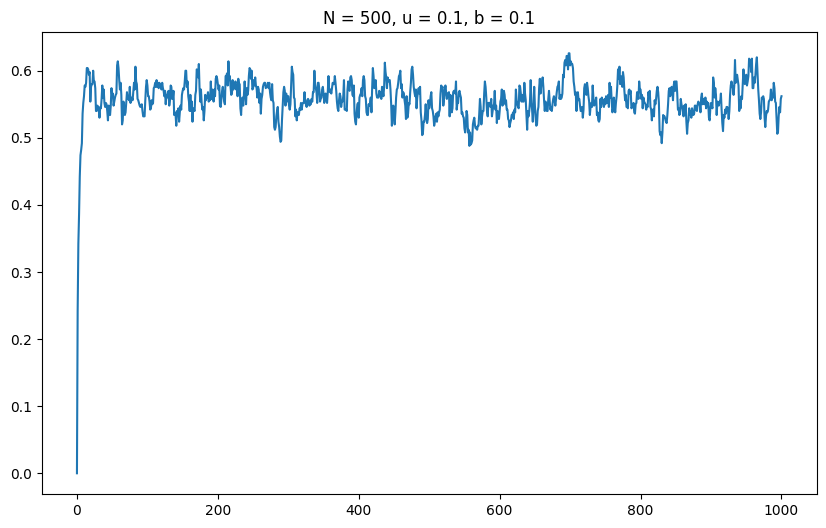

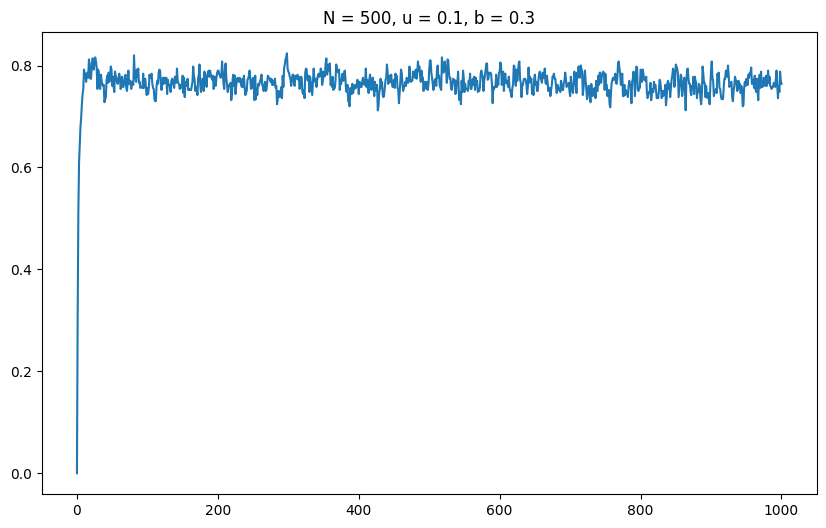

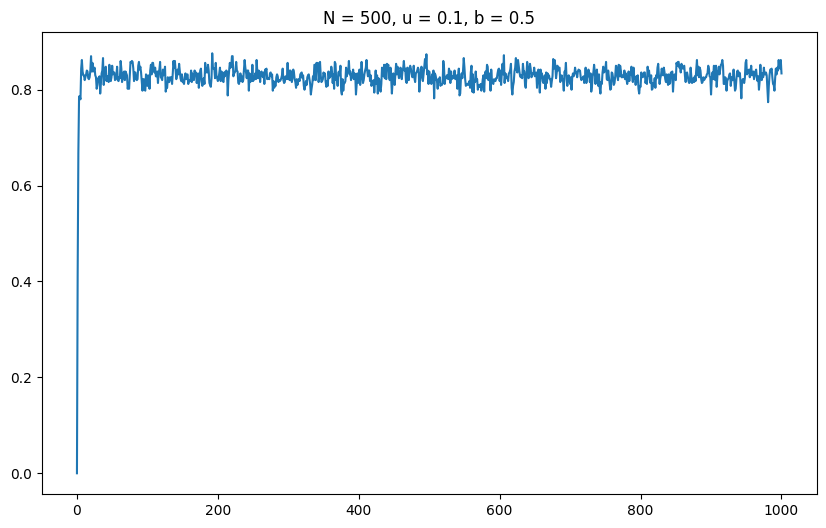

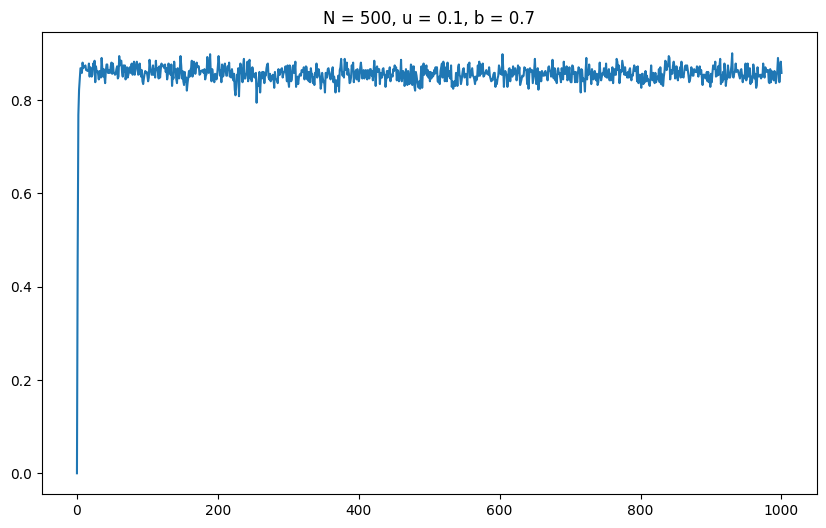

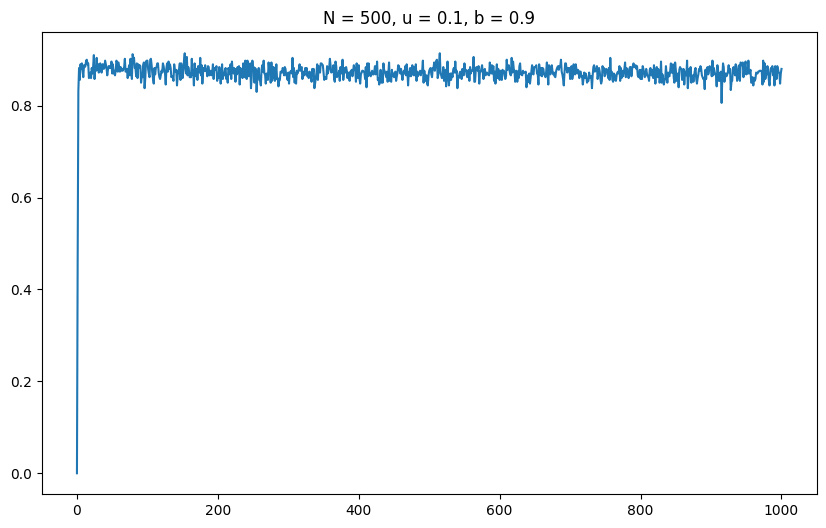

...

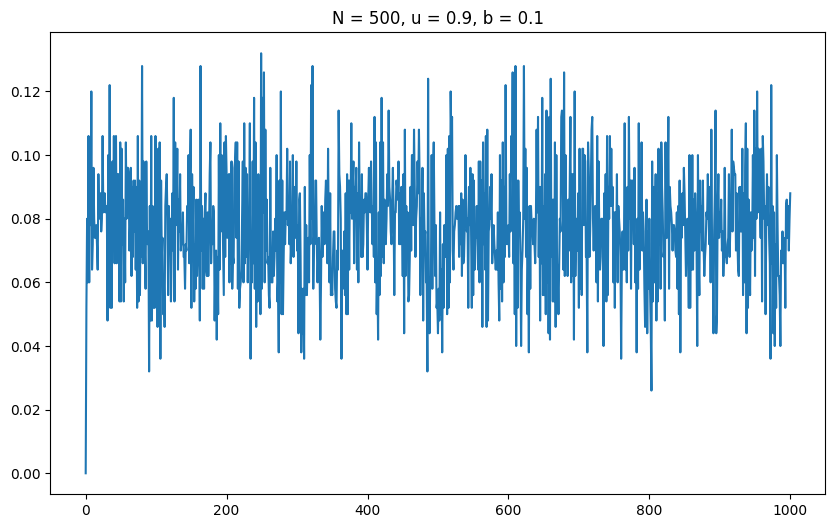

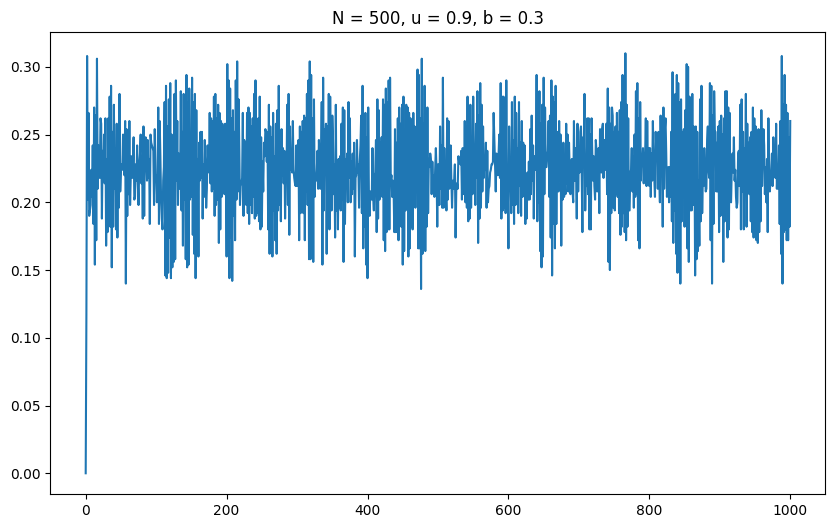

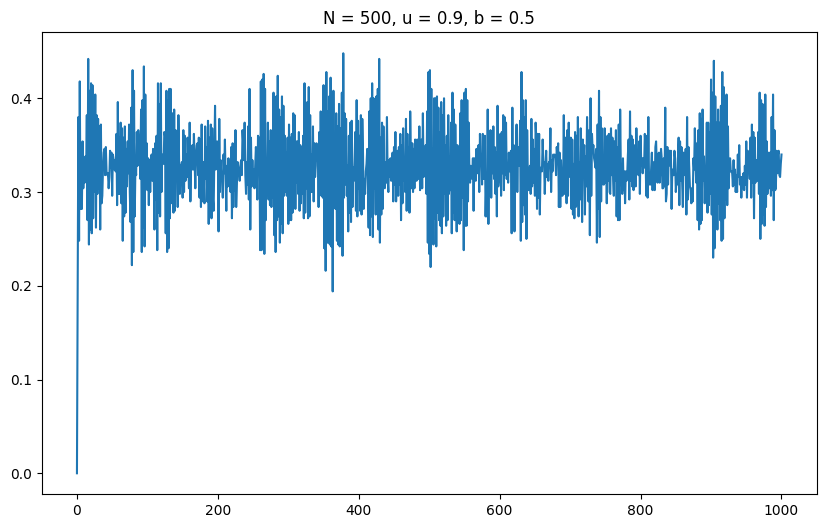

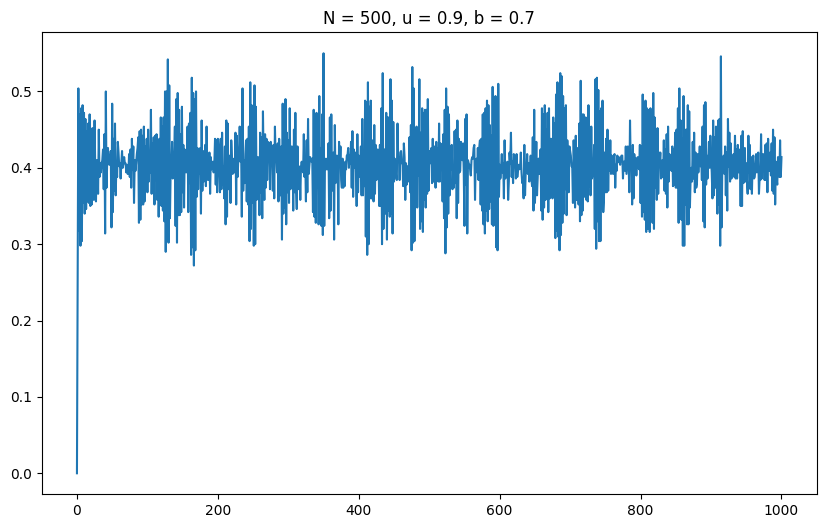

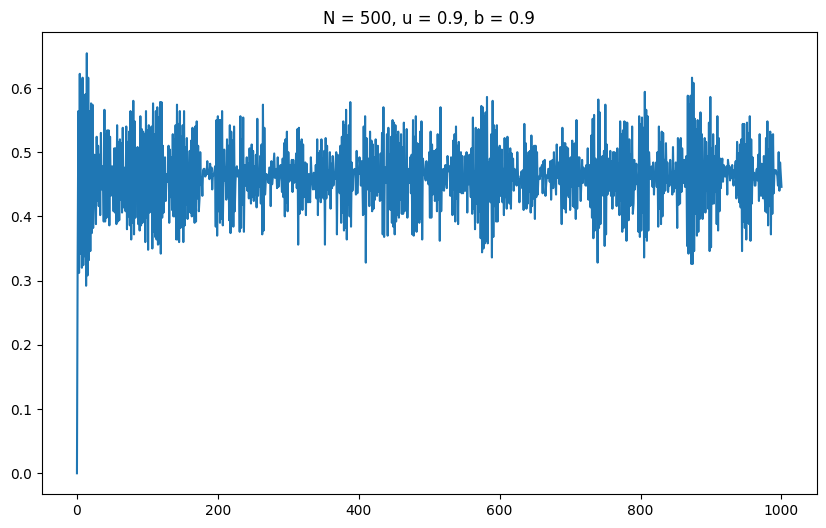

In [71]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(CM_SF_500_21, u, b, plot_time=True)

In [73]:
u_list = [0.1, 0.5, 0.9]

####MC Simulation for the network

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


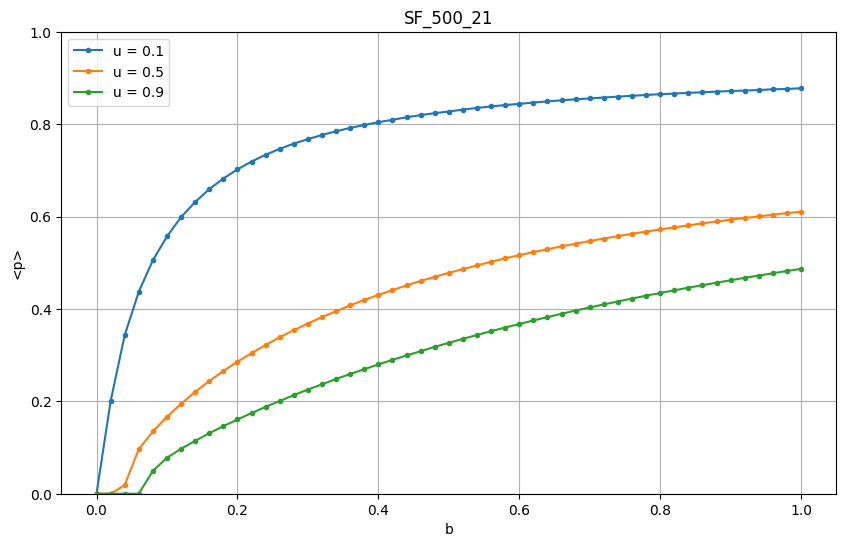

In [82]:
Ttrans = 200
Tmax = 400
Nrep = 100
dict_SF_500_21 = plots(CM_SF_500_21,'SF_500_21', u_list)

####Comparison MC & MMCA

In [74]:
MMCA_SF_500_21 = MMCA_combinations(CM_SF_500_21, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.199854  2.039738e-01
2    0.1  0.04    0.343624  3.492501e-01
3    0.1  0.06    0.437326  4.451293e-01
4    0.1  0.08    0.505817  5.139670e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.467341  4.019288e-01
149  0.9  0.94    0.472242  4.064028e-01
150  0.9  0.96    0.477126  4.108527e-01
151  0.9  0.98    0.482129  4.152276e-01
152  0.9  1.00    0.486715  4.194461e-01

[153 rows x 4 columns]


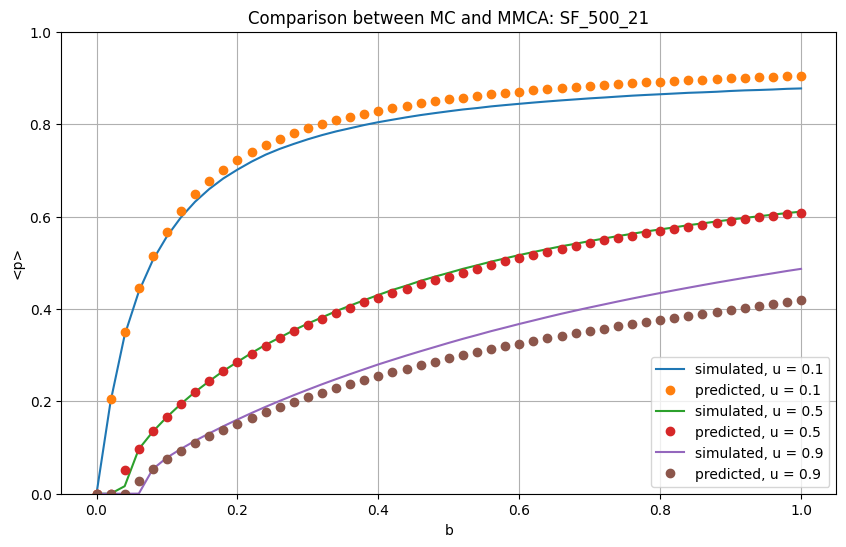

In [81]:
plot_comparison(dict_SF_500_21, MMCA_SF_500_21, u_list, 'SF_500_21')

###Network : CM_SF_500_55

In [83]:
N=500
gamma=5.5
node_degrees=SF_even(N, gamma)
CM_SF_500_55=CM(node_degrees)
nx.write_pajek(CM_SF_500_55, "/content/drive/MyDrive/A4_Networks/CM_SF_500_55")

####SIS Combinations

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-6-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


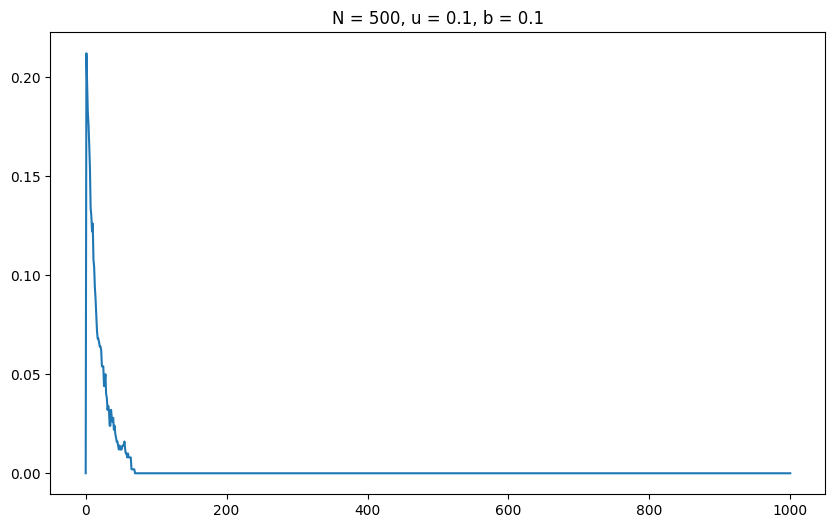

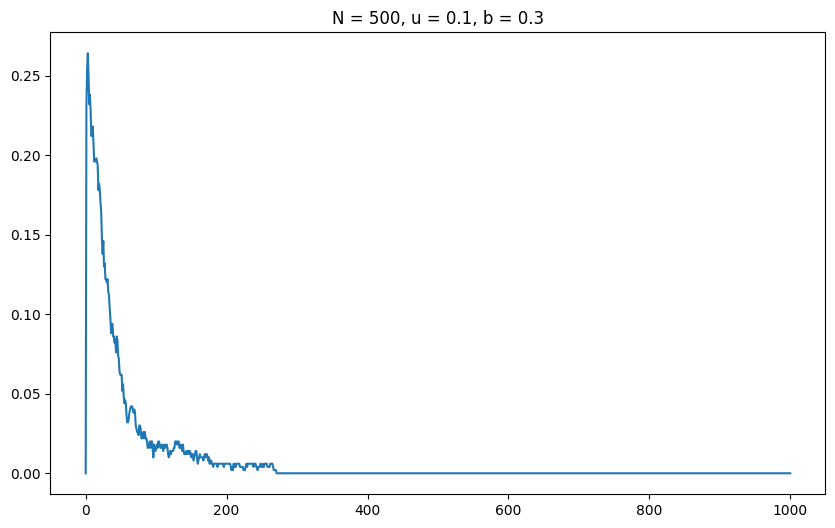

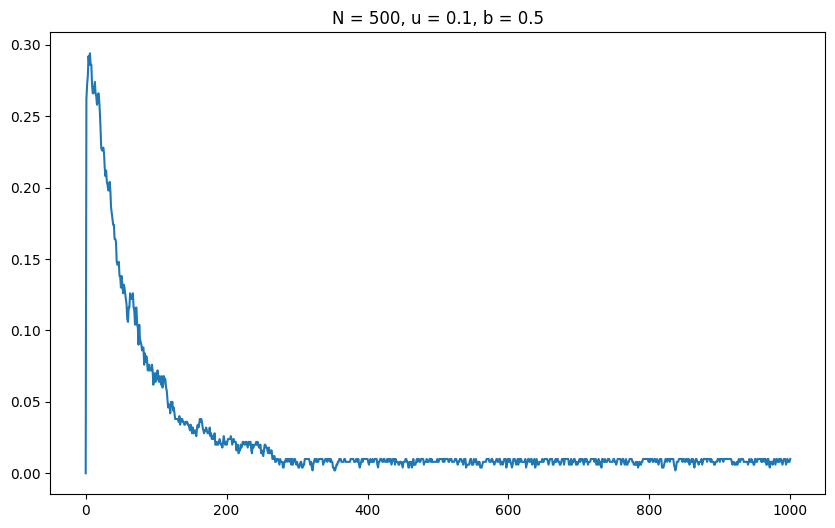

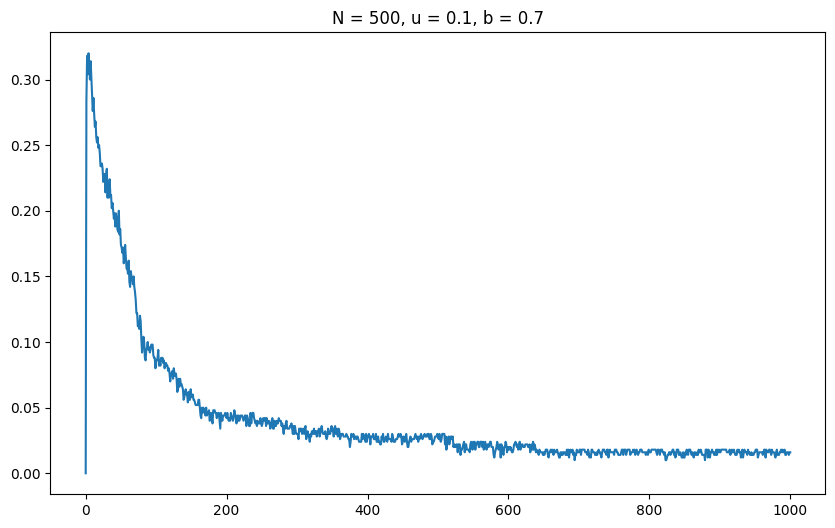

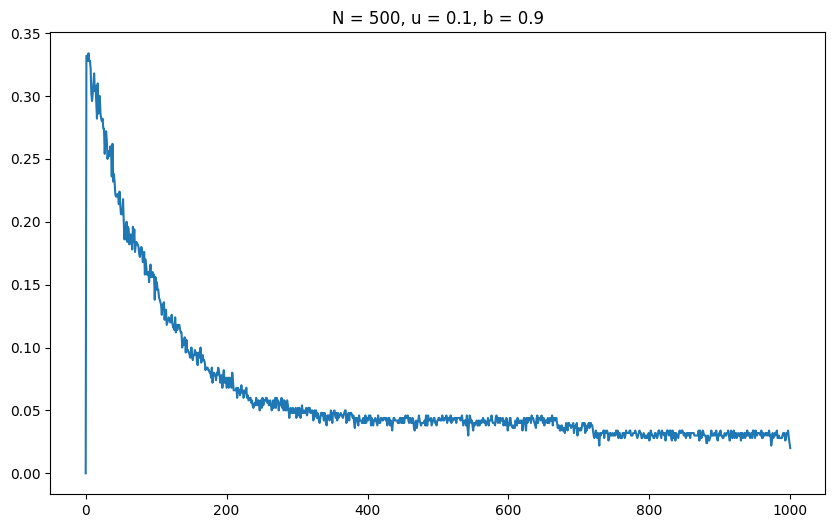

...

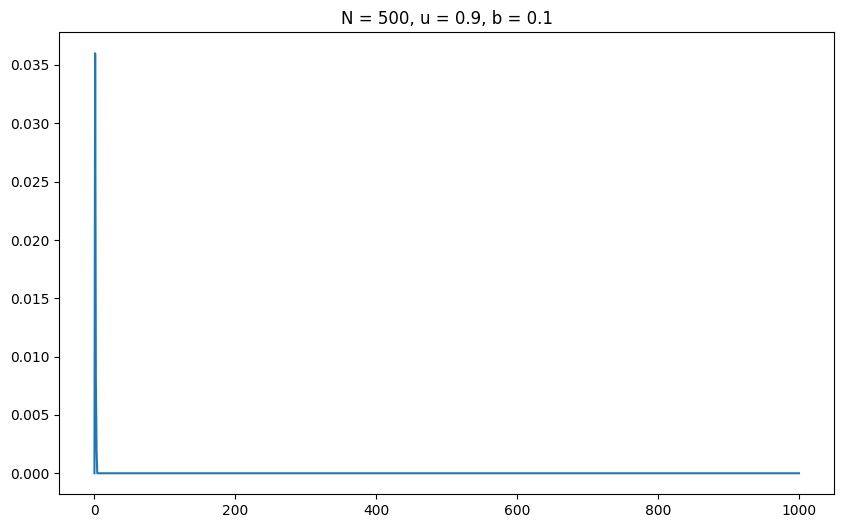

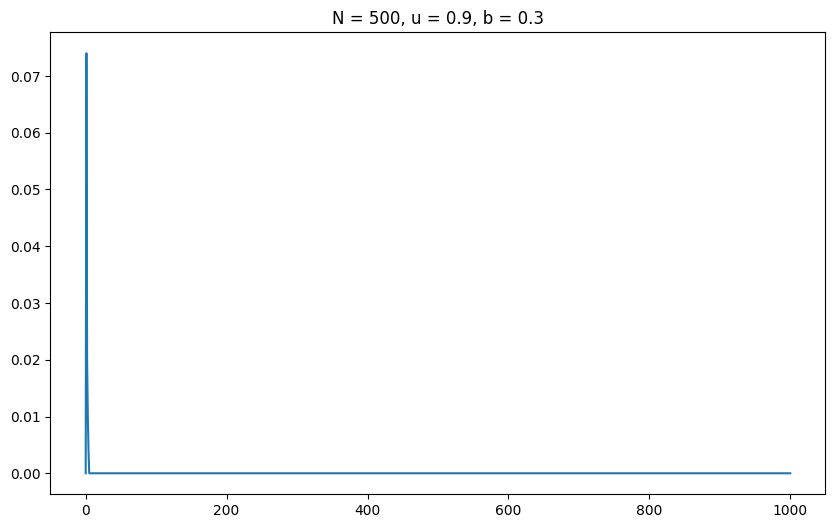

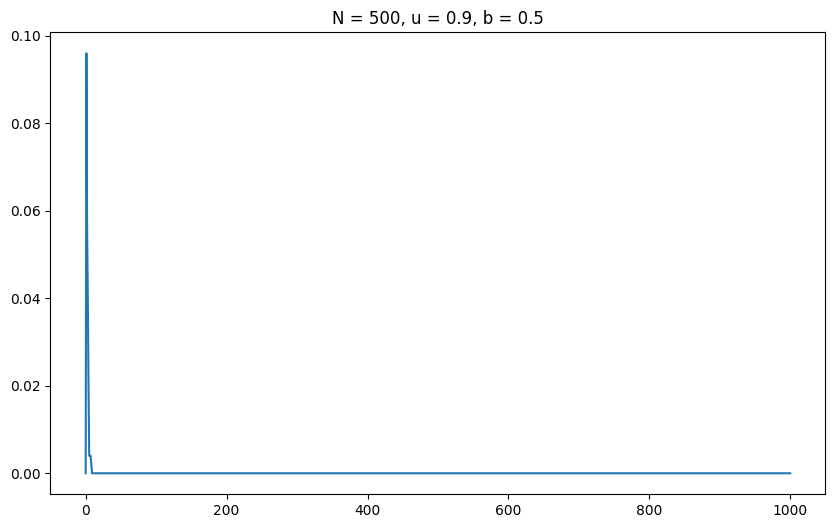

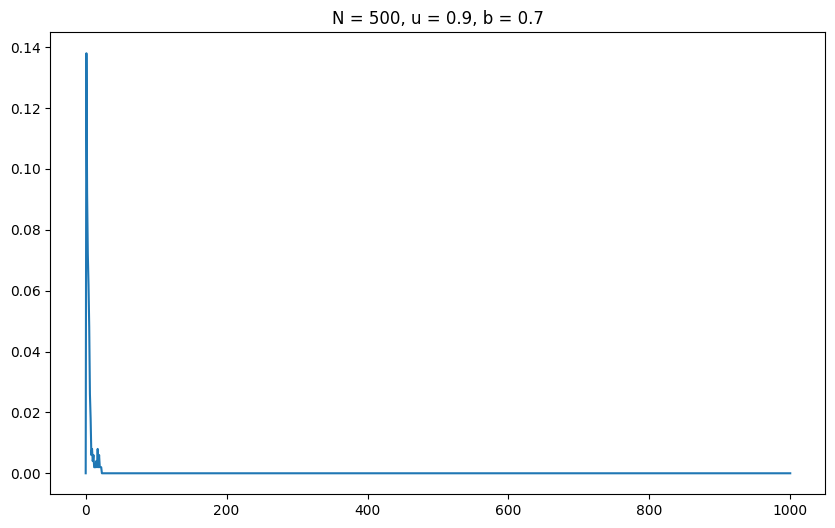

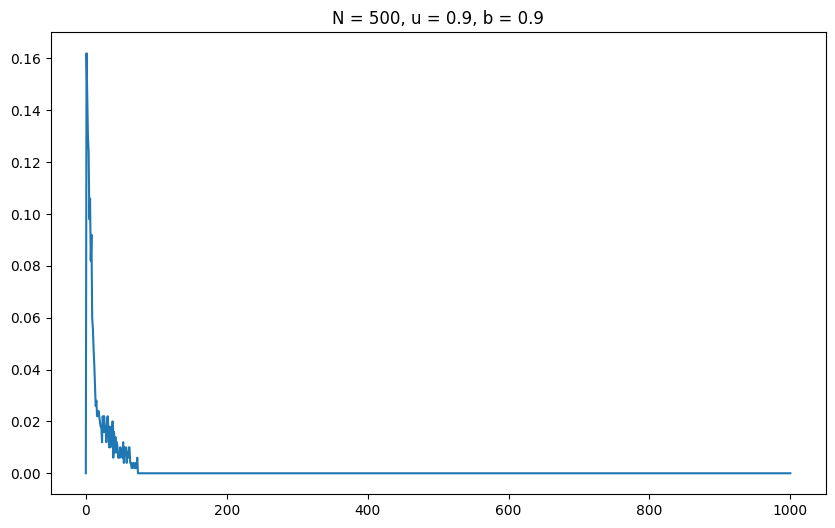

In [84]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(CM_SF_500_55, u, b, plot_time=True)

In [85]:
u_list = [0.1, 0.5, 0.9]

####MC Simulation for the network

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


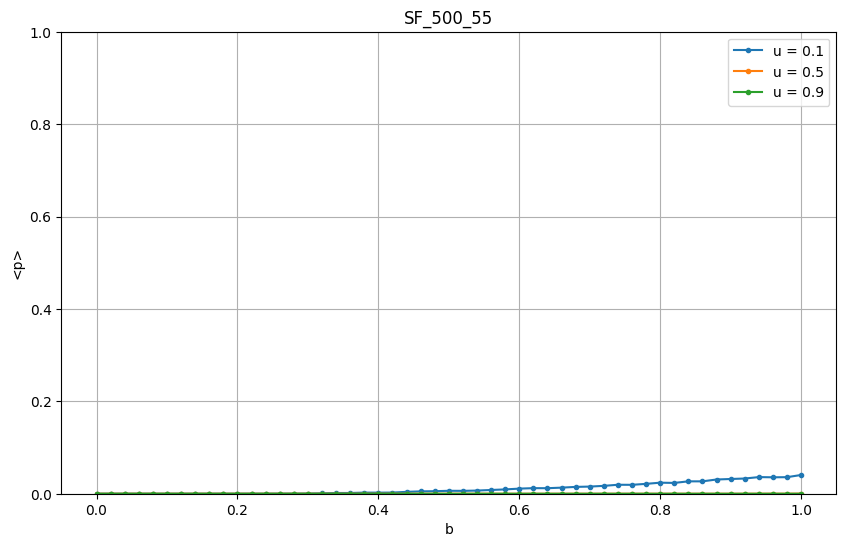

In [86]:
Ttrans = 900
Tmax = 1000
Nrep = 100
dict_SF_500_55 = plots(CM_SF_500_55,'SF_500_55', u_list)

####Comparison MC & MMCA

In [87]:
MMCA_SF_500_55 = MMCA_combinations(CM_SF_500_55, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.000000  4.932872e-15
2    0.1  0.04    0.000000  1.227214e-07
3    0.1  0.06    0.000000  1.458901e-03
4    0.1  0.08    0.000000  1.864846e-02
..   ...   ...         ...           ...
148  0.9  0.92    0.000000  7.014144e-02
149  0.9  0.94    0.000000  9.127058e-02
150  0.9  0.96    0.000000  1.112017e-01
151  0.9  0.98    0.000000  1.300391e-01
152  0.9  1.00    0.000026  1.478769e-01

[153 rows x 4 columns]


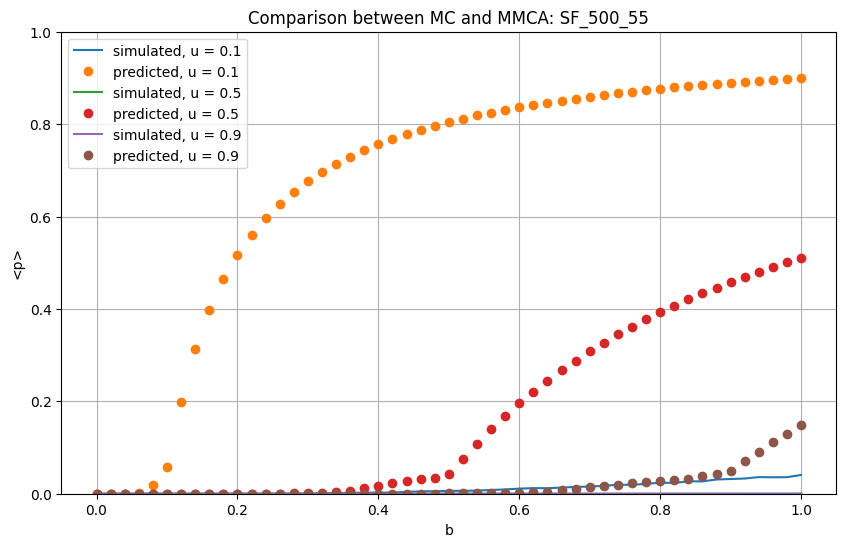

In [88]:
plot_comparison(dict_SF_500_55, MMCA_SF_500_55, u_list, 'SF_500_55')

##Real Networks 

###Network : Airports

In [13]:
path='/content/drive/MyDrive/A4_Networks/airports_UW.net'
airports=nx.read_pajek(path)
airports=nx.convert_node_labels_to_integers(airports)

####SIS Combinations

<ipython-input-6-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-6-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


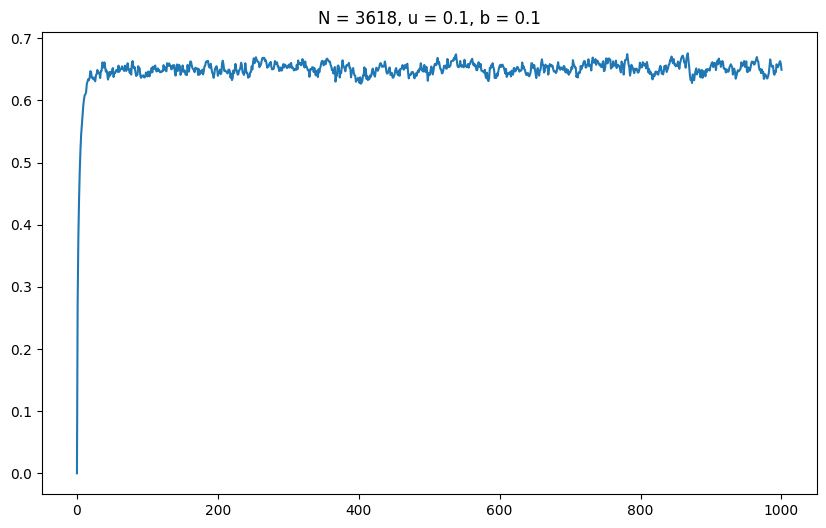

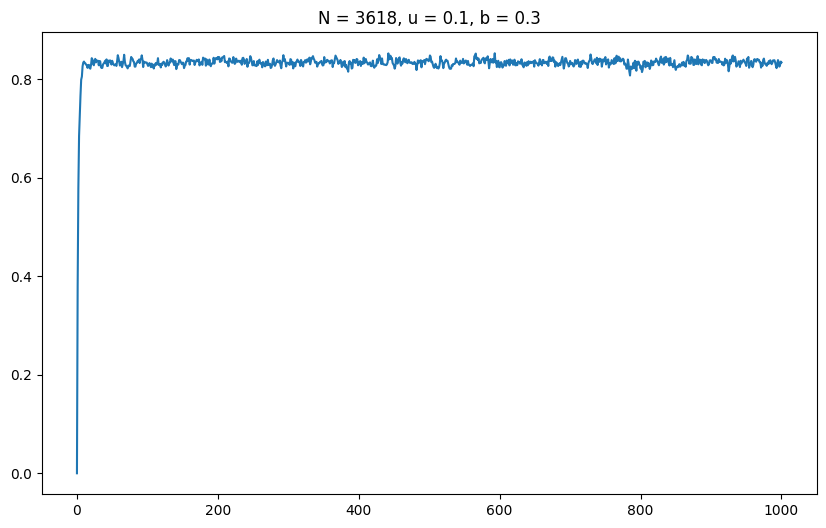

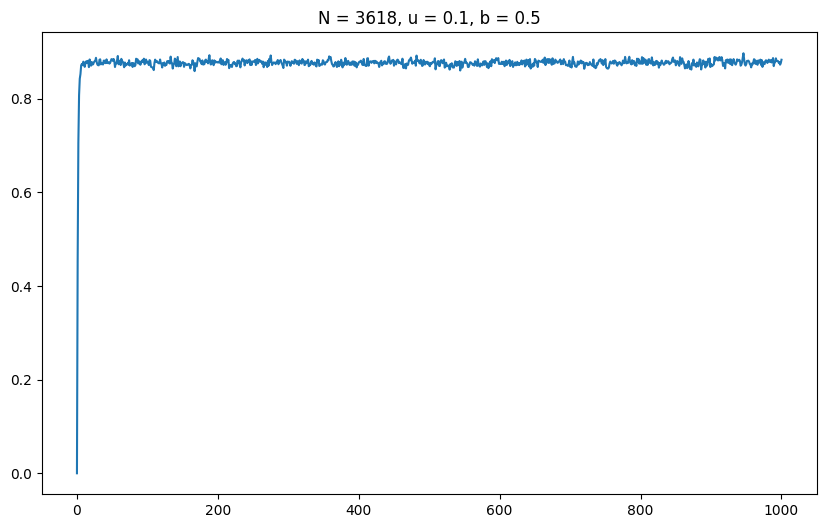

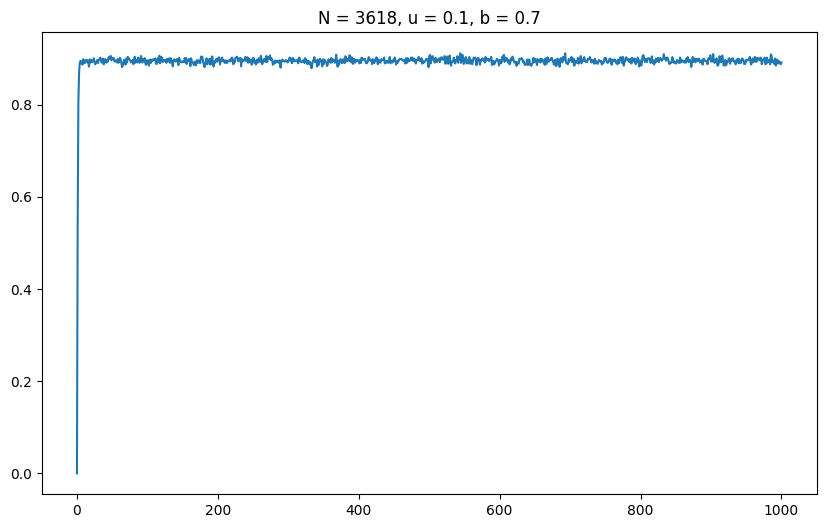

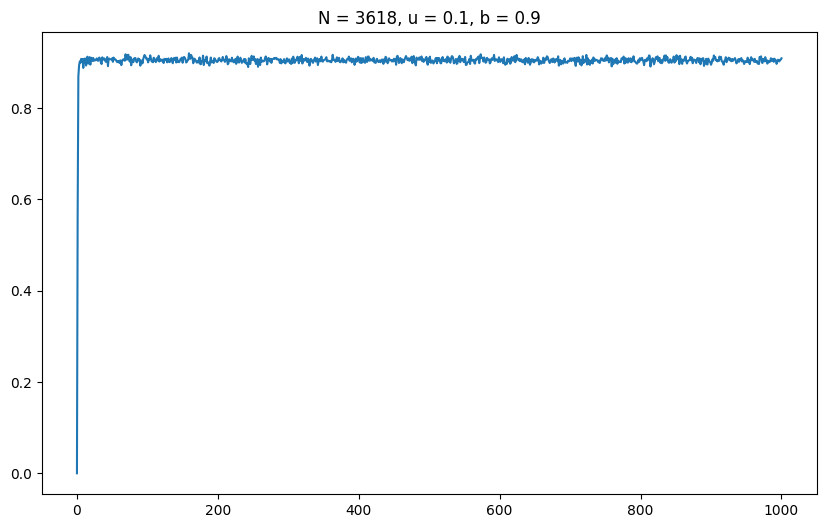

...

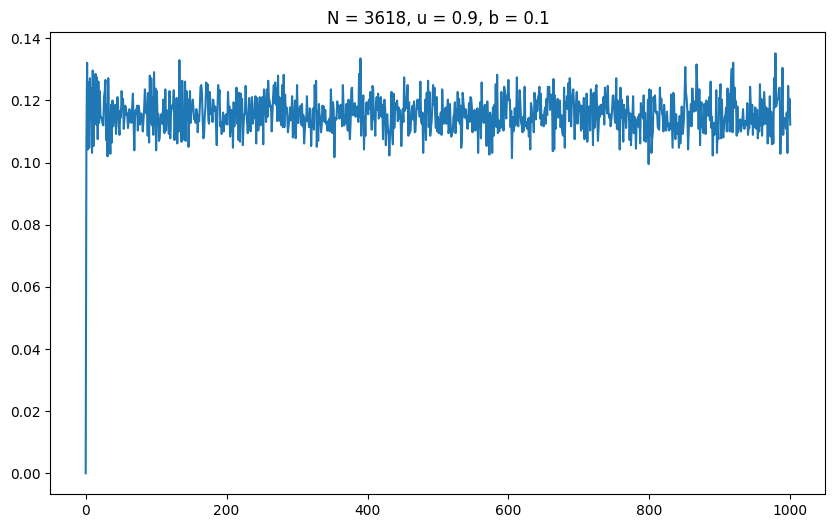

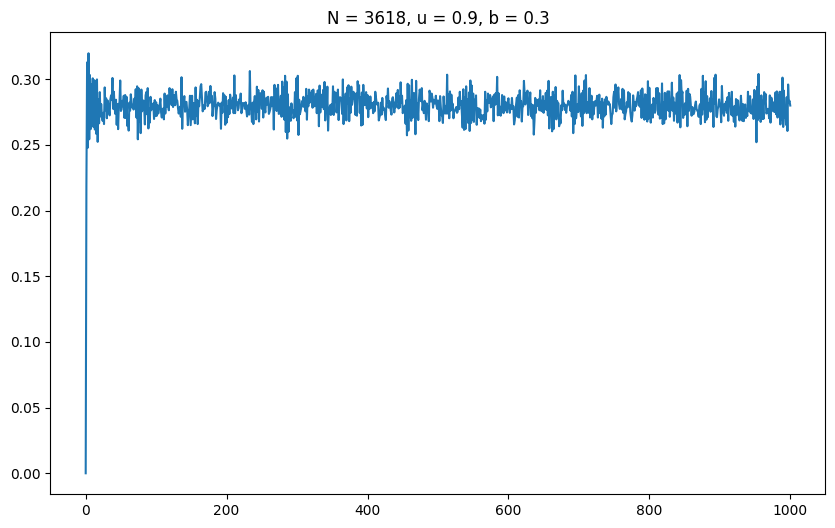

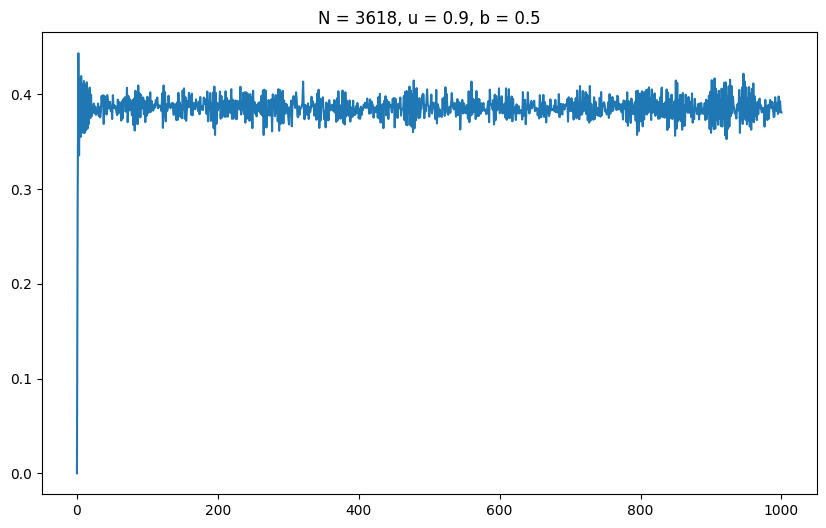

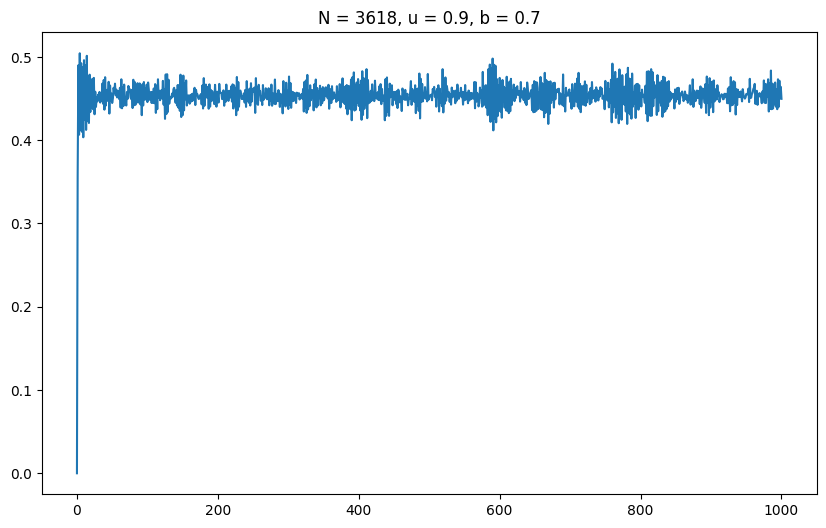

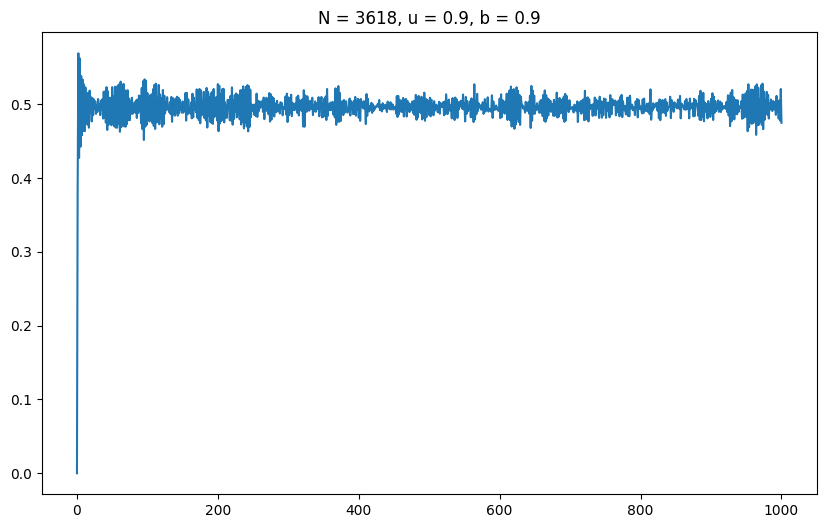

In [90]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(airports, u, b, plot_time=True)

In [14]:
u_list = [0.1, 0.5,  0.9]


####MC Simulation for the network

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


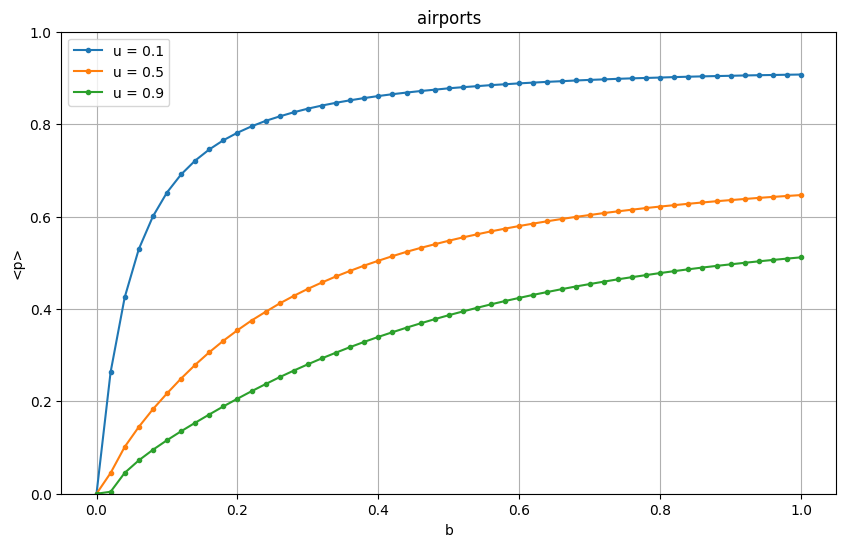

In [15]:
Ttrans = 100
Tmax = 300
Nrep = 50

dict_airports = plots(airports,'airports', u_list)

####Comparison MC & MMCA

In [16]:
MMCA_airports = MMCA_combinations(airports, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.263154  2.735380e-01
2    0.1  0.04    0.424946  4.415315e-01
3    0.1  0.06    0.529321  5.461816e-01
4    0.1  0.08    0.600070  6.159332e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.499838  4.581163e-01
149  0.9  0.94    0.502995  4.612027e-01
150  0.9  0.96    0.506003  4.641621e-01
151  0.9  0.98    0.508898  4.670290e-01
152  0.9  1.00    0.511673  4.697743e-01

[153 rows x 4 columns]


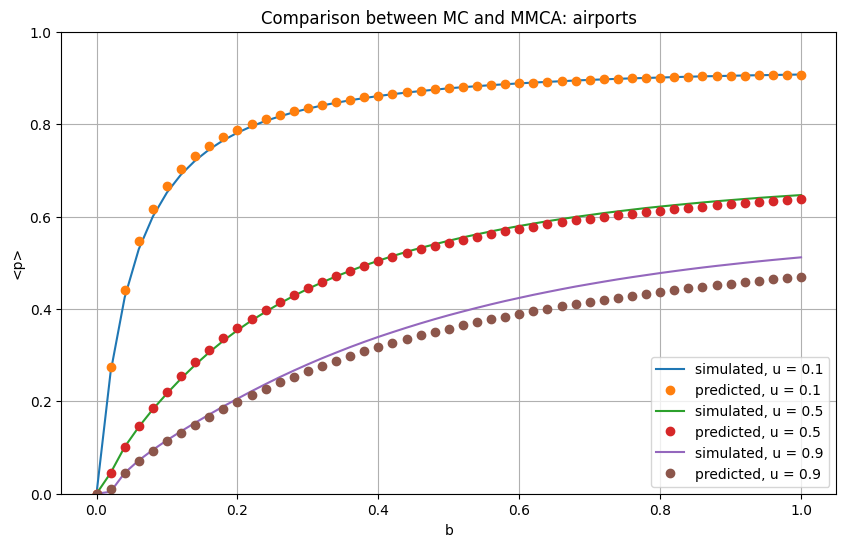

In [17]:
plot_comparison(dict_airports, MMCA_airports, u_list, 'airports')

###Network : Football 

In [35]:
path='/content/drive/MyDrive/A4_Networks/football.net'
football=nx.read_pajek(path)
football=nx.convert_node_labels_to_integers(football)

####SIS Combinations

<ipython-input-8-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-8-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


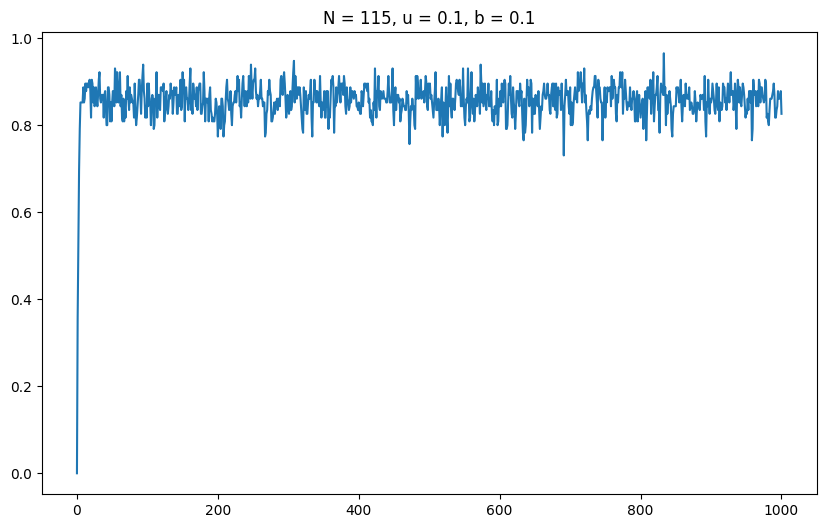

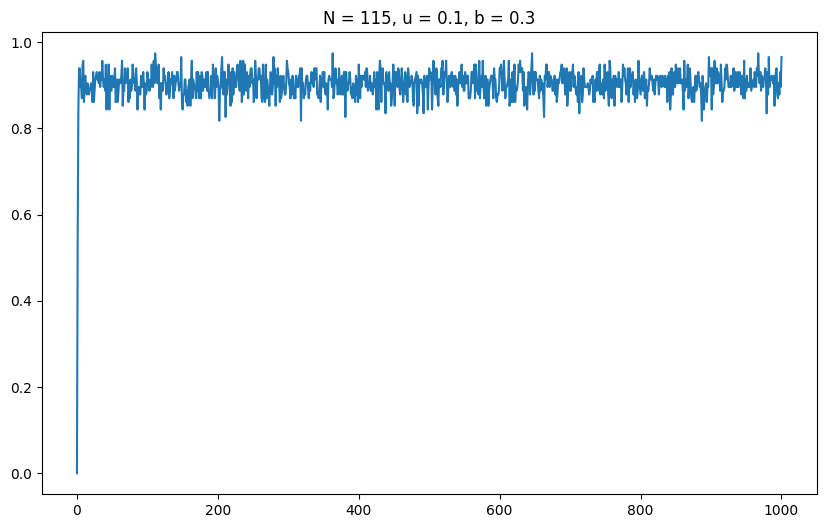

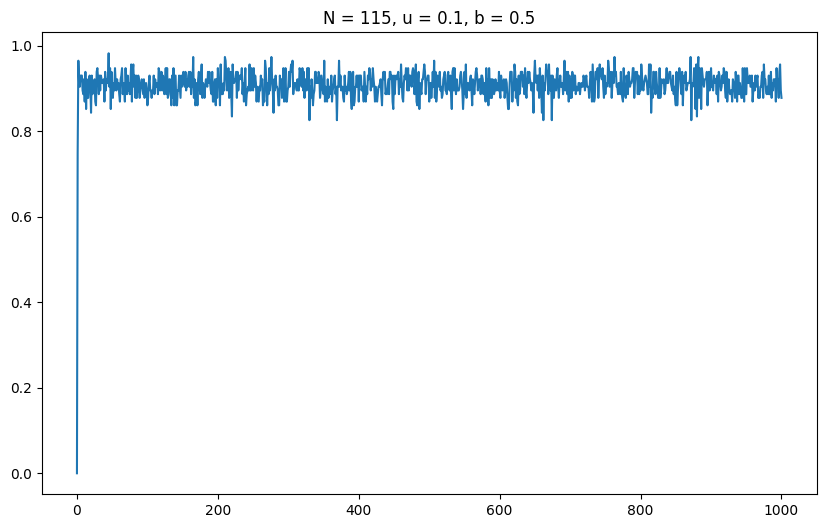

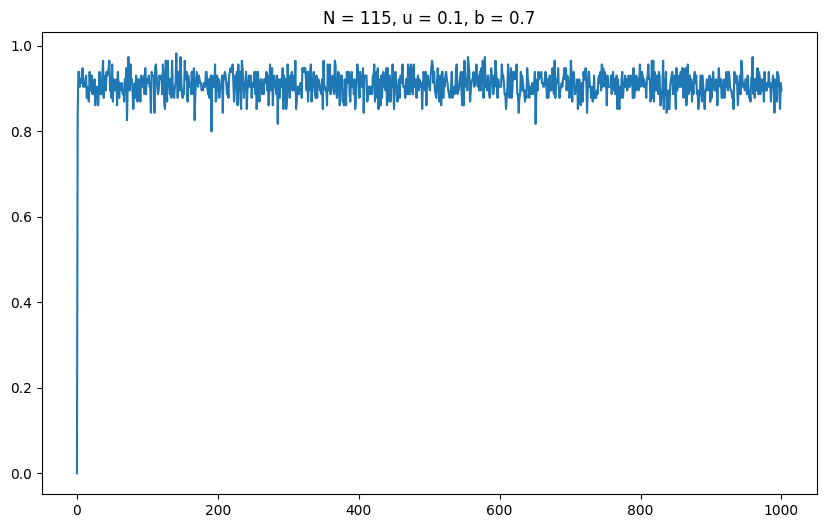

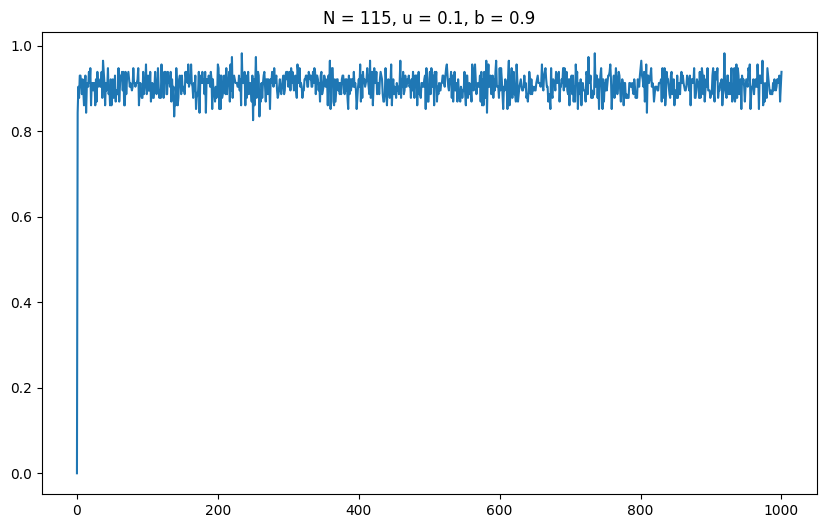

...

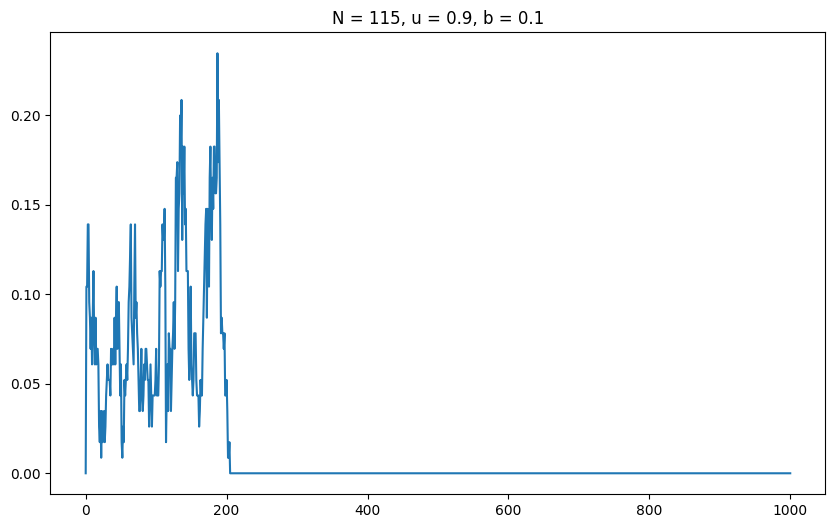

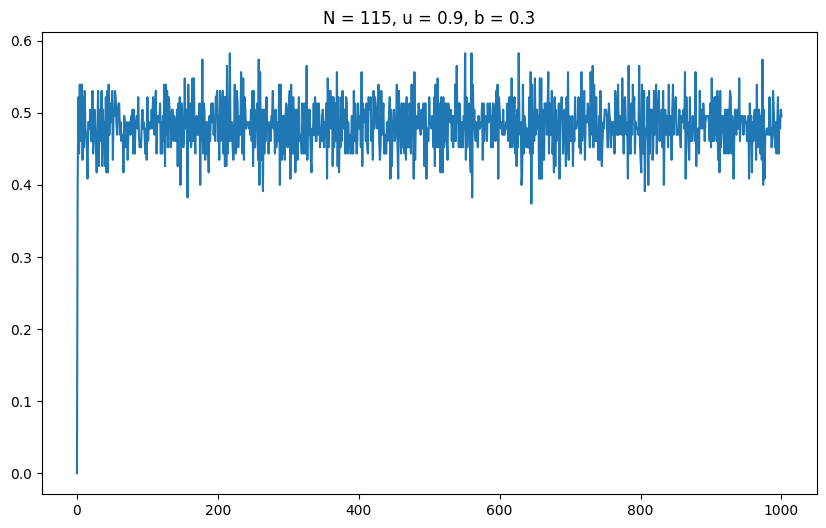

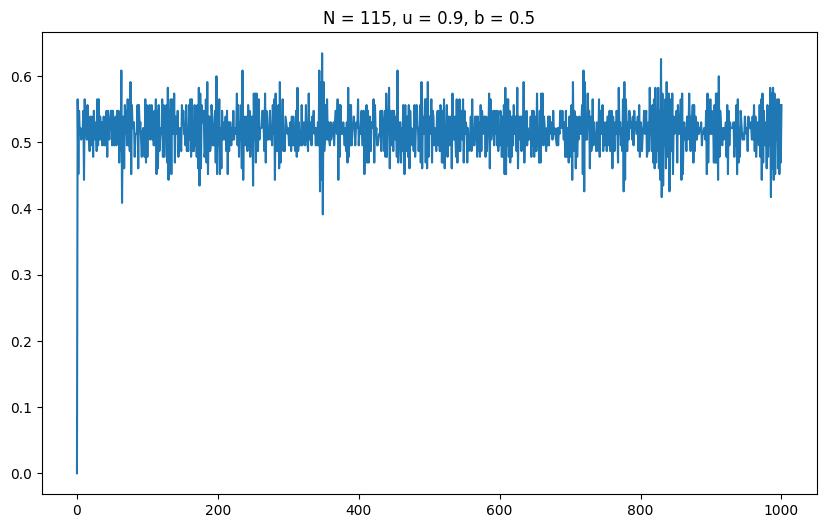

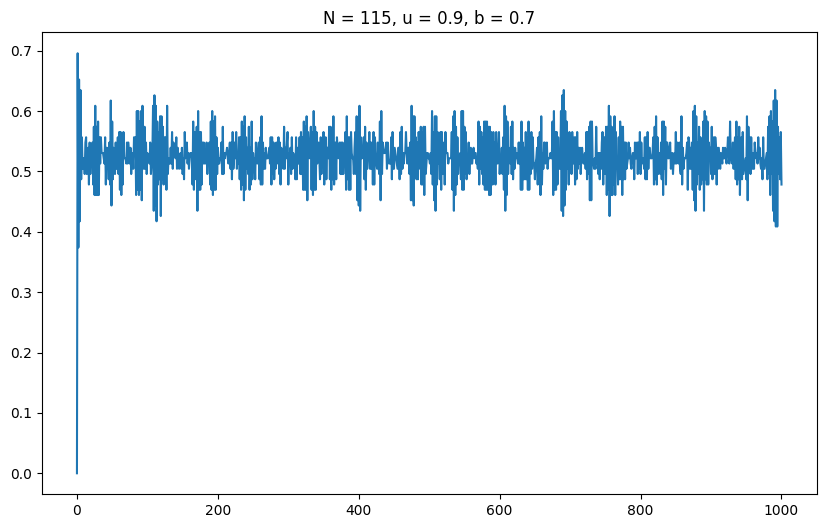

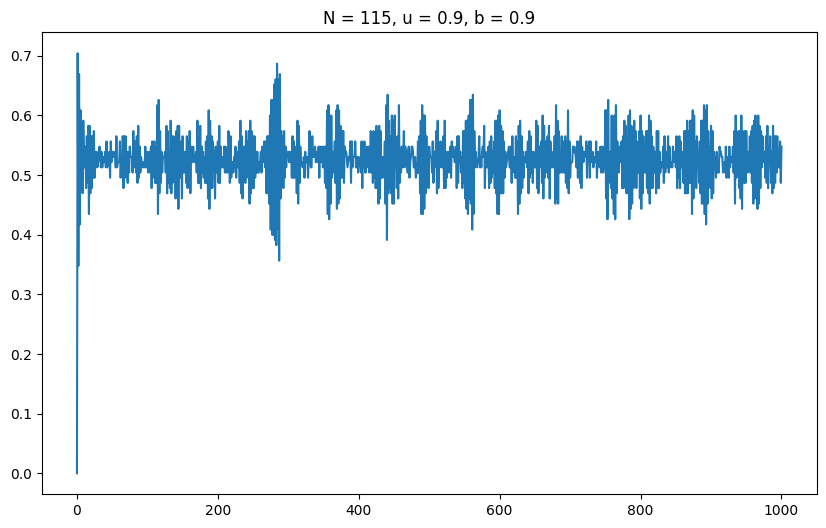

In [22]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(football, u, b, plot_time=True)

In [36]:
u_list = [0.1, 0.5,  0.9]


####MC Simulation for the network

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


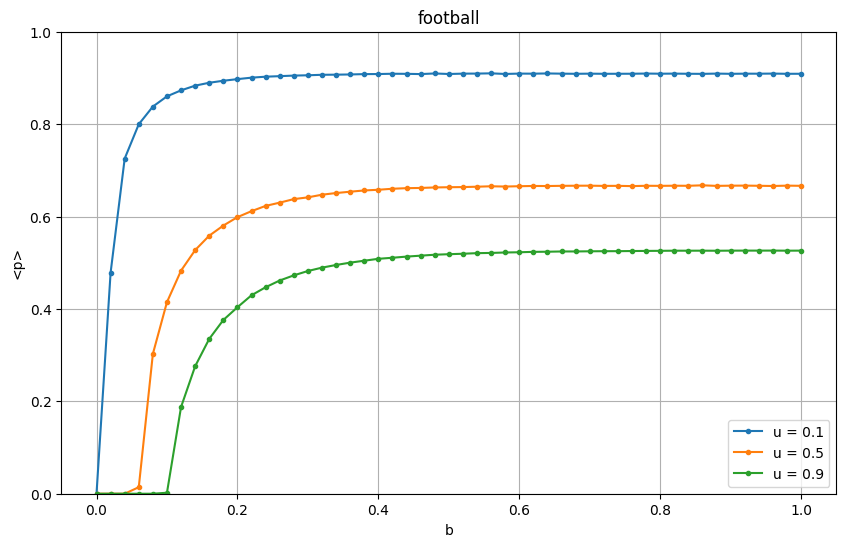

In [41]:
Ttrans = 200
Tmax = 300
Nrep = 50

dict_football = plots(football,'football', u_list)

####Comparison MC & MMCA

In [42]:
MMCA_football = MMCA_combinations(football, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.478285  5.069717e-01
2    0.1  0.04    0.725447  7.294585e-01
3    0.1  0.06    0.799743  8.029153e-01
4    0.1  0.08    0.837986  8.389197e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.526219  5.260440e-01
149  0.9  0.94    0.526217  5.260941e-01
150  0.9  0.96    0.526277  5.261356e-01
151  0.9  0.98    0.526068  5.261698e-01
152  0.9  1.00    0.526184  5.261979e-01

[153 rows x 4 columns]


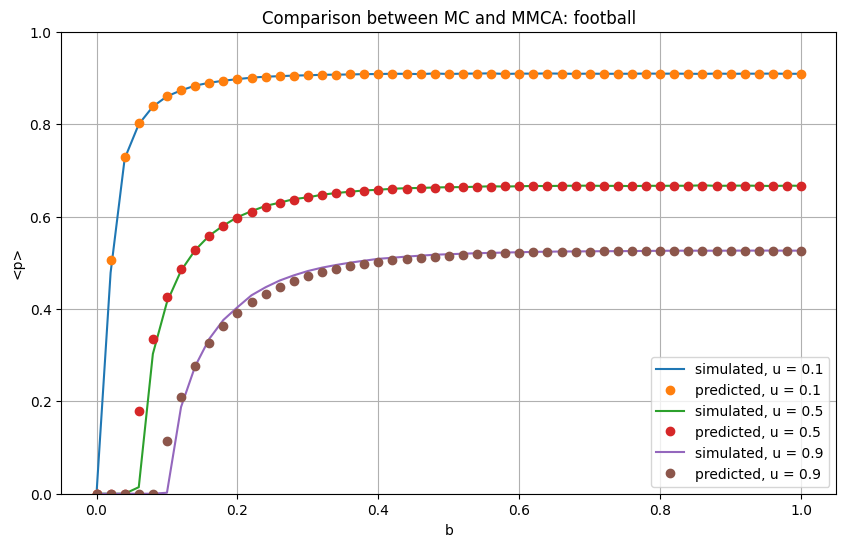

In [43]:
plot_comparison(dict_football, MMCA_football, u_list, 'football')

###Network : Dolphins

In [33]:
path='/content/drive/MyDrive/A4_Networks/dolphins.net'
dolphins=nx.read_pajek(path)
dolphins=nx.convert_node_labels_to_integers(dolphins)

####SIS Combinations

<ipython-input-8-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-8-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


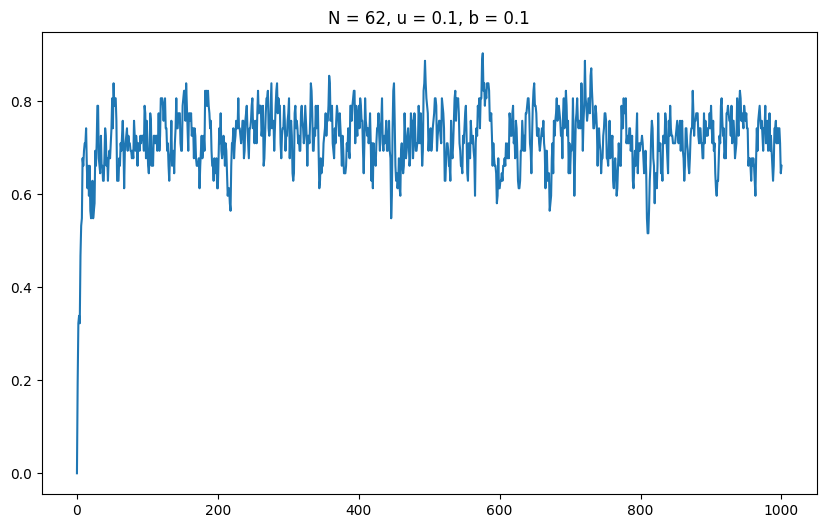

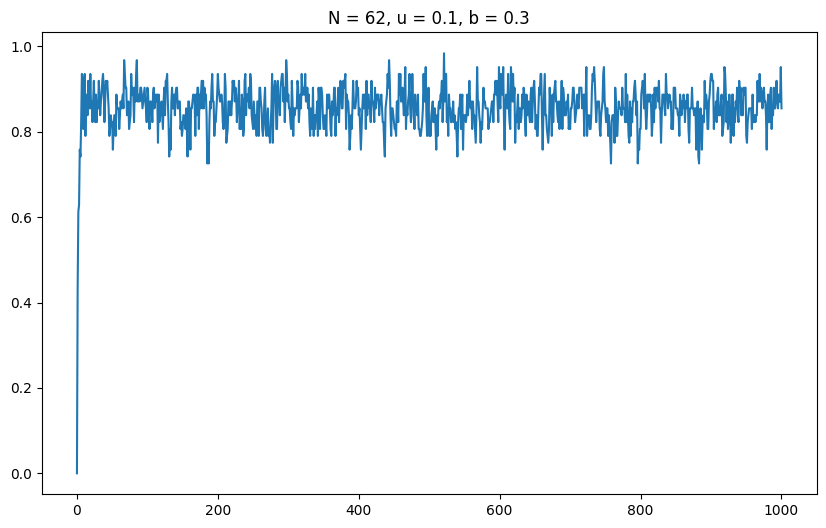

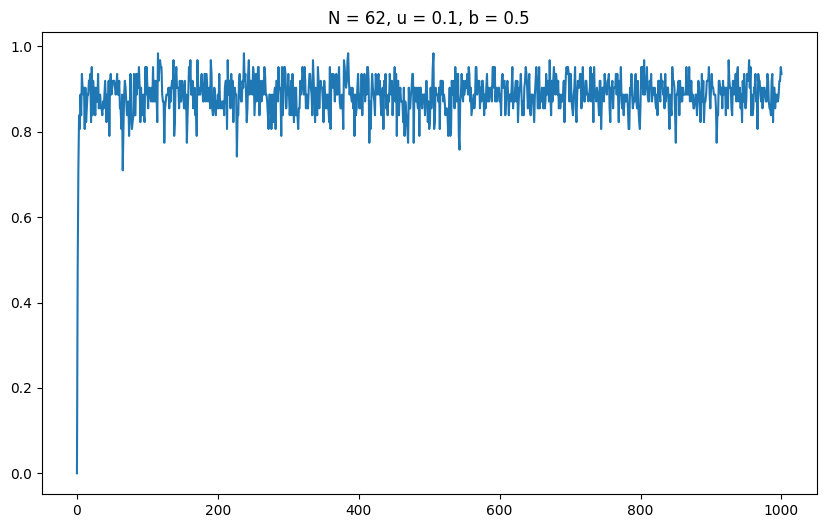

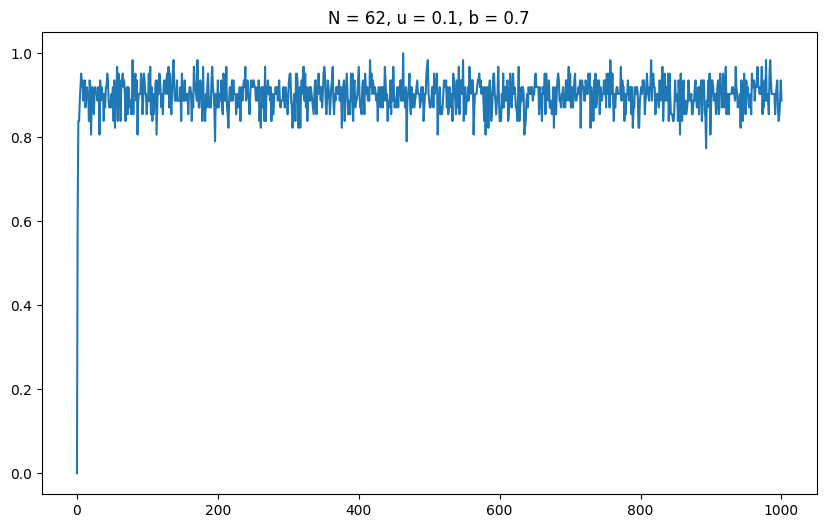

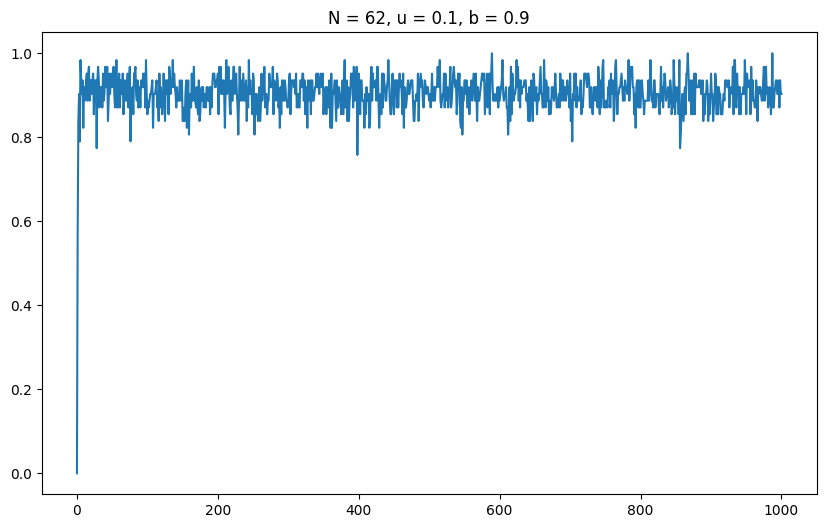

...

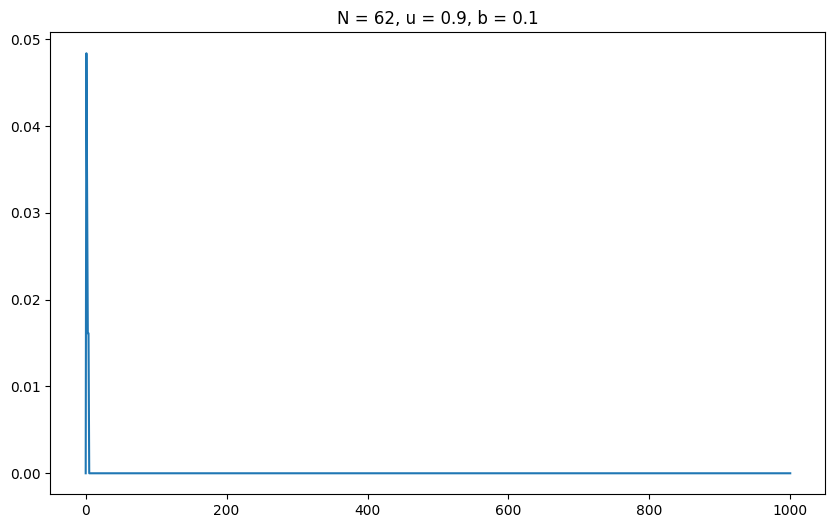

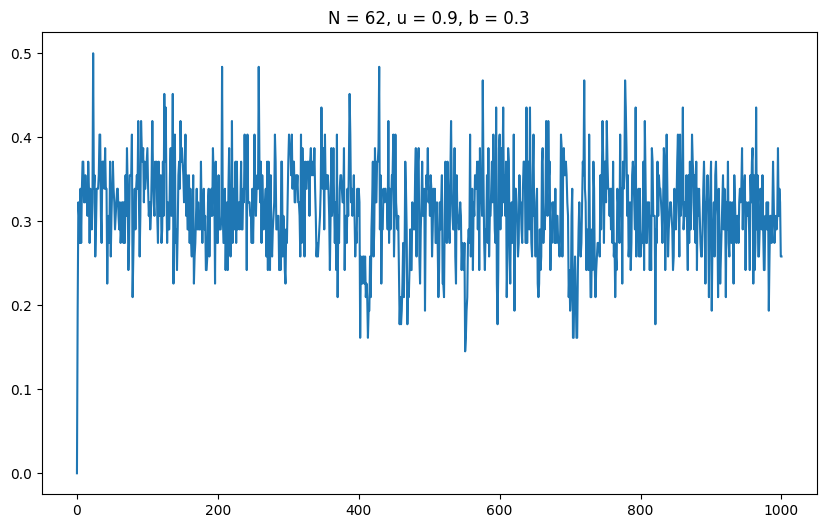

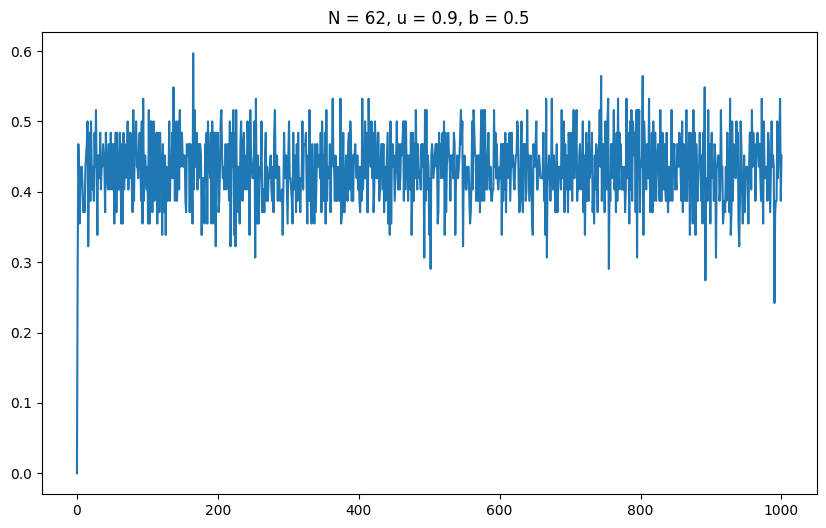

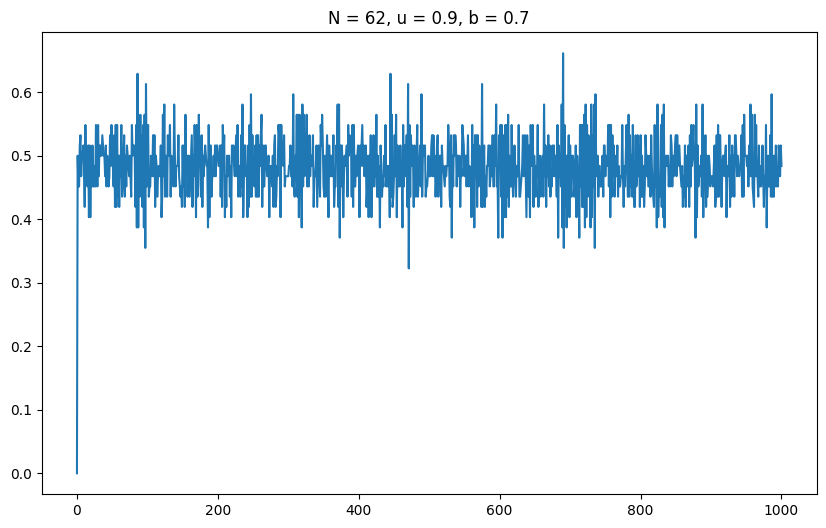

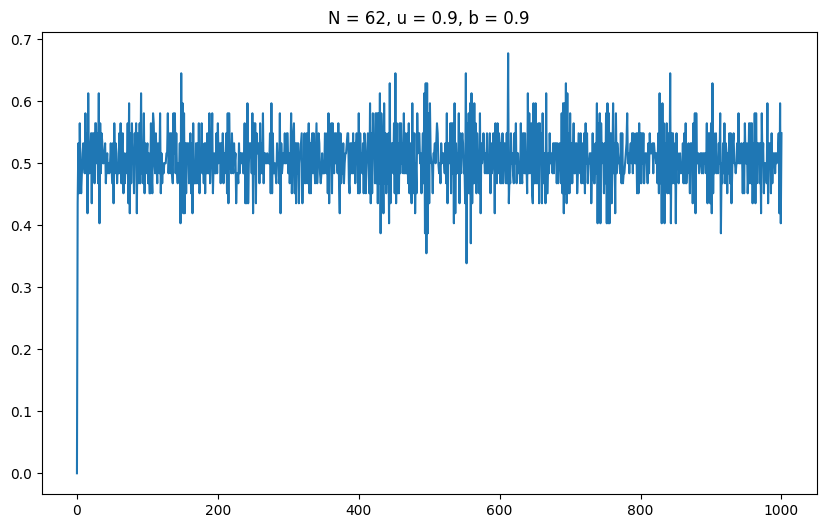

In [28]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(dolphins, u, b, plot_time=True)

In [34]:
u_list = [0.1, 0.5,  0.9]


####MC Simulation for the network

<ipython-input-9-bf07f678f397>:8: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  infected_nodes = set(random.sample(susceptible_nodes, round(initial_infected_frac*num_nodes)))


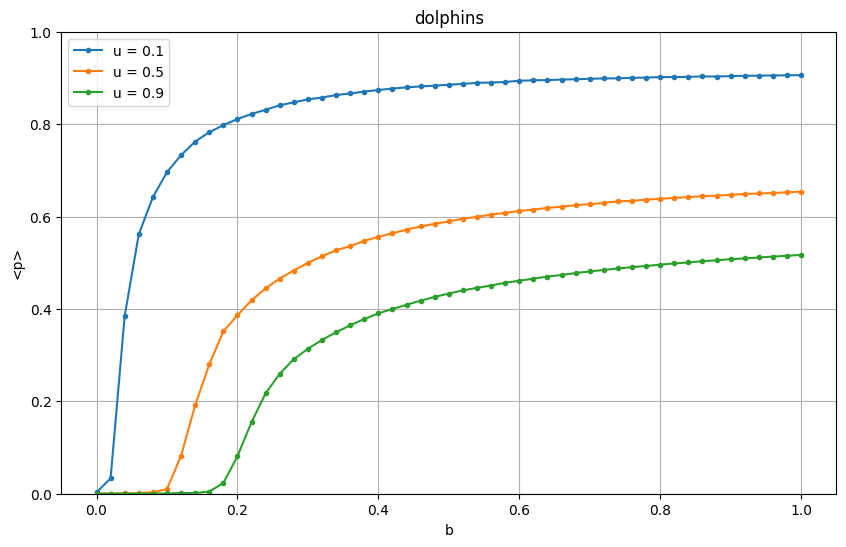

In [30]:
Ttrans = 200
Tmax = 300
Nrep = 50

dict_dolphins = plots(dolphins,'dolphins', u_list)

####Comparison MC & MMCA

In [31]:
MMCA_dolphins = MMCA_combinations(dolphins, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.002784  8.959107e-21
1    0.1  0.02    0.033238  1.732595e-01
2    0.1  0.04    0.384917  4.734913e-01
3    0.1  0.06    0.561441  5.997330e-01
4    0.1  0.08    0.641905  6.713094e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.509335  4.838702e-01
149  0.9  0.94    0.511418  4.857217e-01
150  0.9  0.96    0.513202  4.874893e-01
151  0.9  0.98    0.515066  4.891785e-01
152  0.9  1.00    0.516886  4.907941e-01

[153 rows x 4 columns]


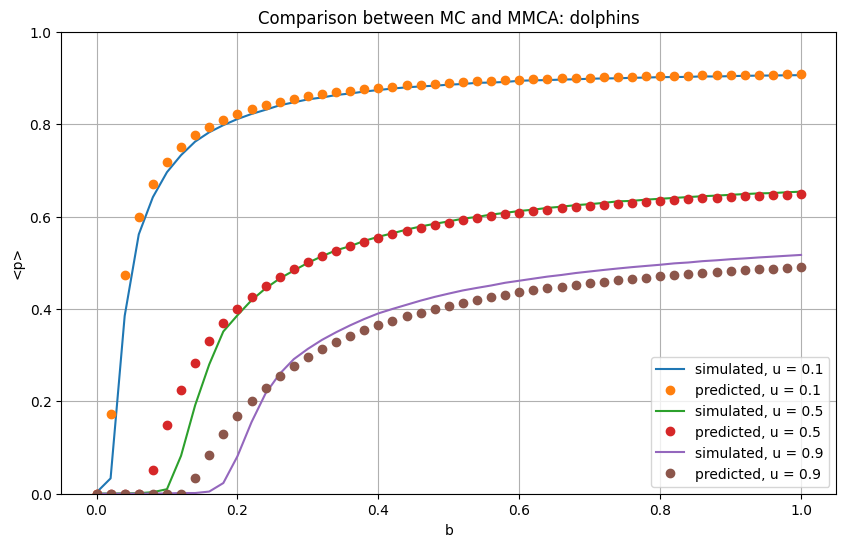

In [32]:
plot_comparison(dict_dolphins, MMCA_dolphins, u_list, 'dolphins')

###Network : PGP 

In [24]:
path='/content/drive/MyDrive/A4_Networks/PGP.net'
PGP=nx.read_pajek(path)
PGP=nx.convert_node_labels_to_integers(PGP)

####SIS Combinations

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-4-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


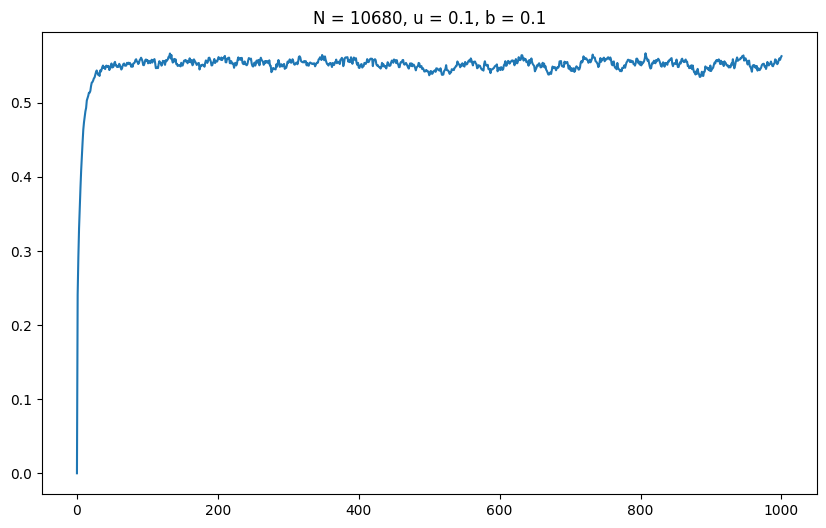

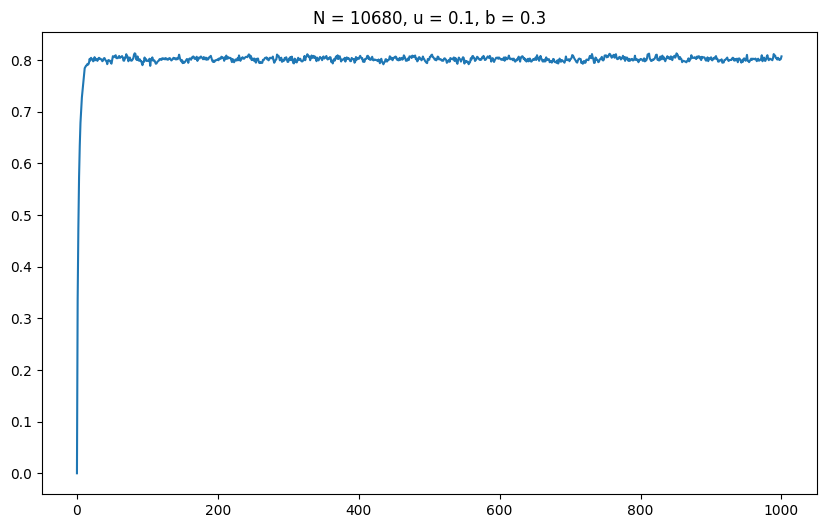

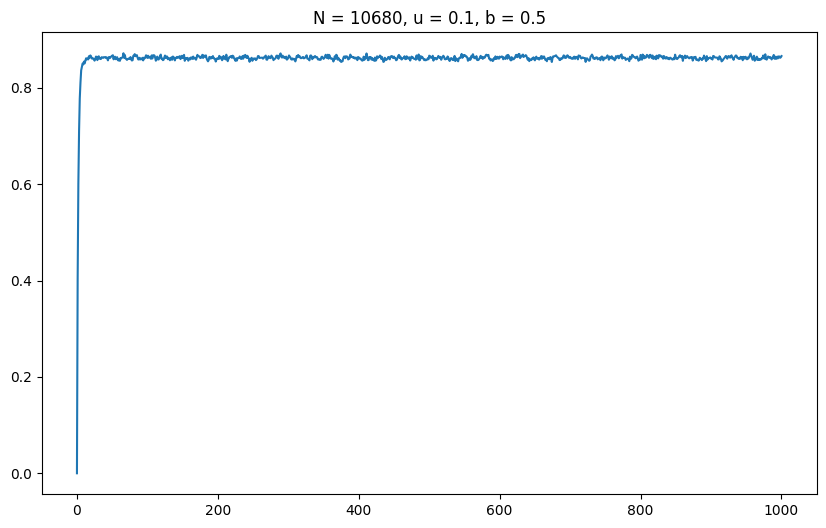

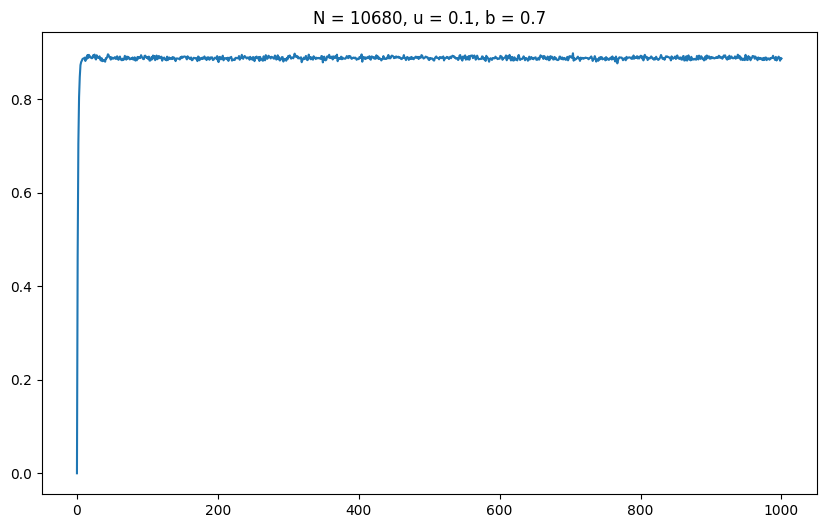

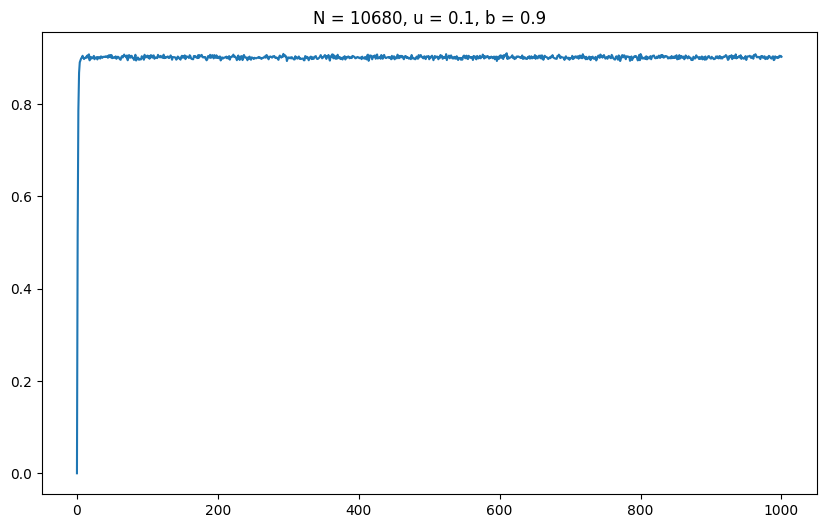

...

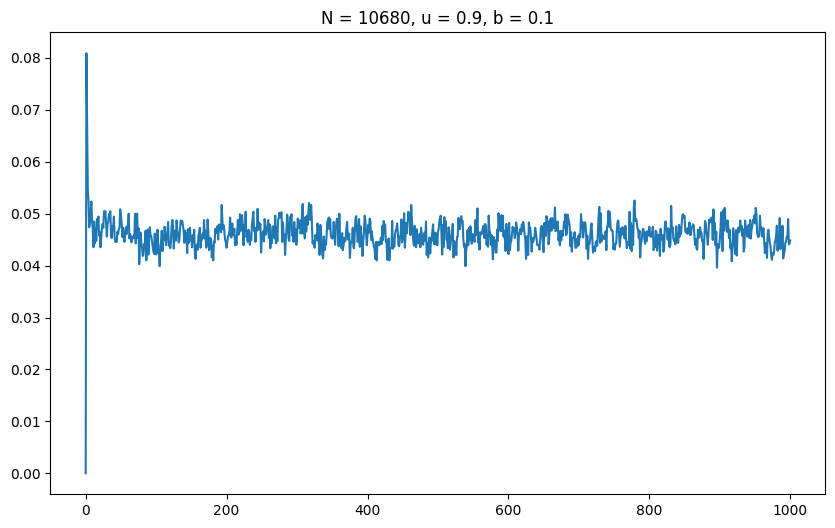

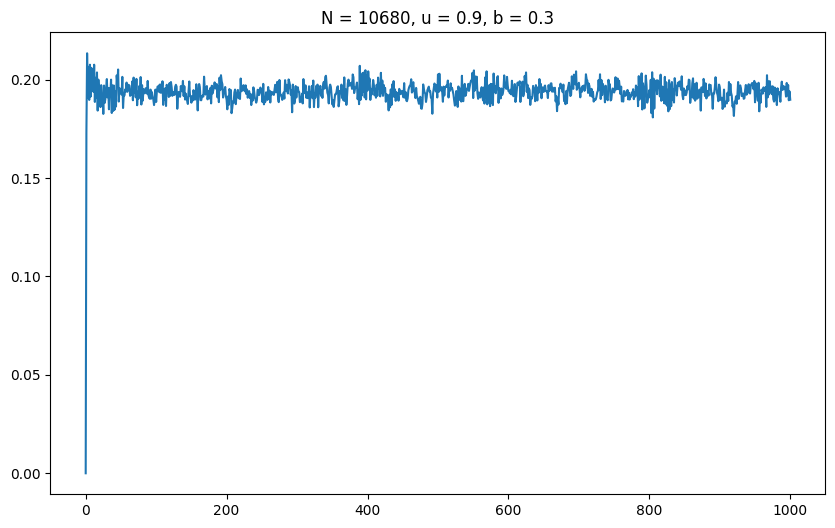

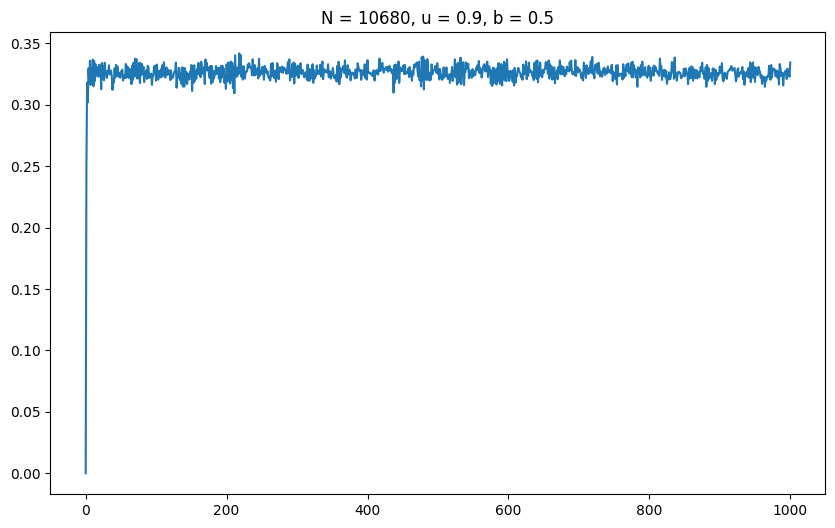

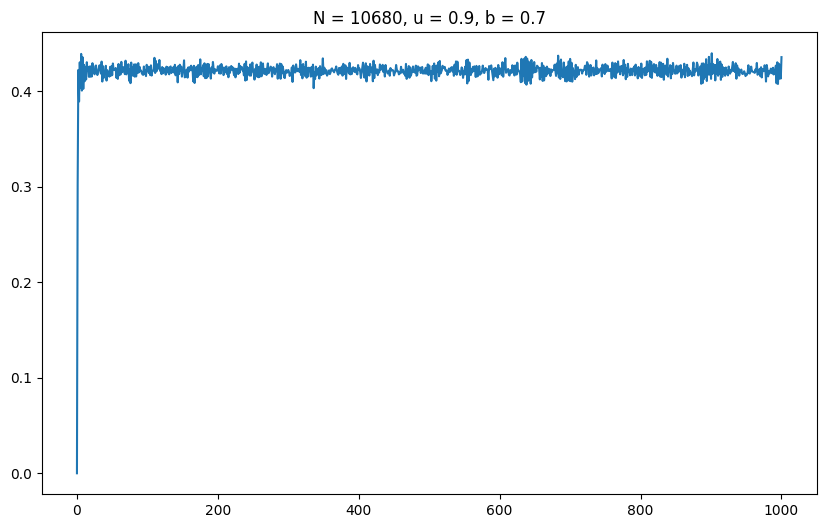

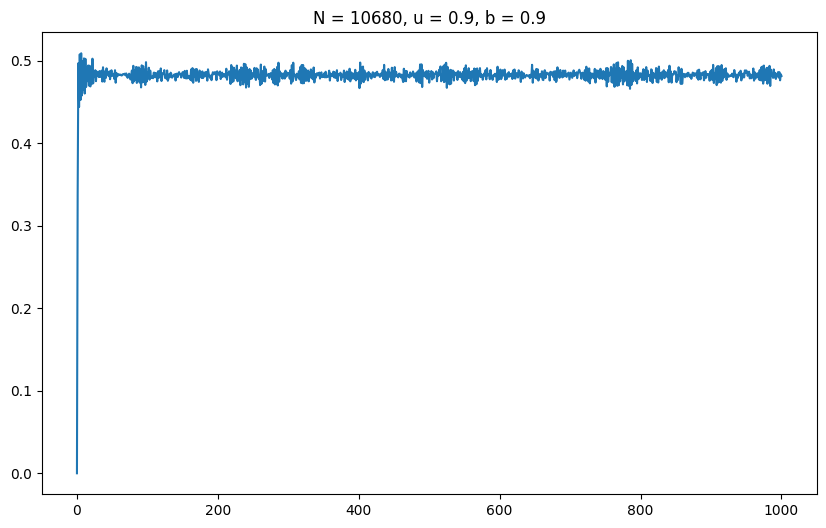

In [25]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(PGP, u, b, plot_time=True)

In [44]:
u_list = [0.1]


####MC Simulation for the network

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


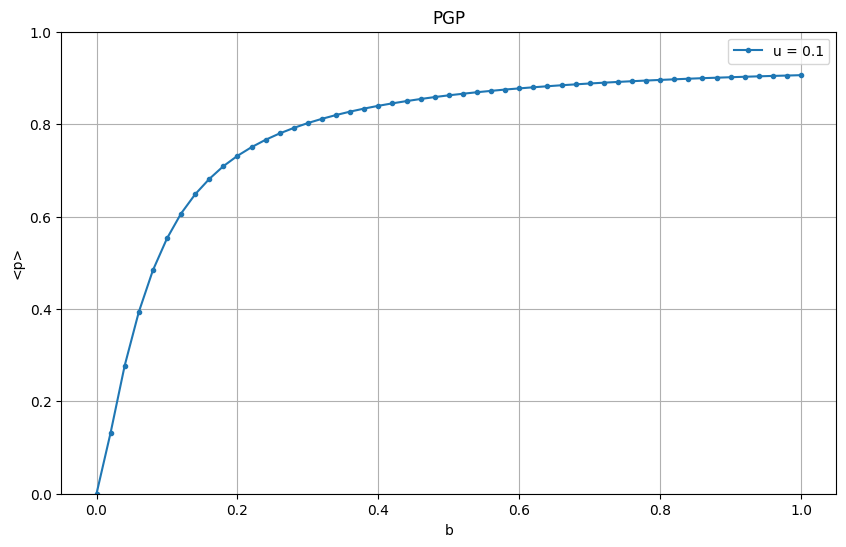

In [45]:
Ttrans = 100
Tmax = 300
Nrep = 50

dict_PGP = plots(PGP,'PGP', u_list)

####Comparison MC & MMCA

In [46]:
MMCA_PGP = MMCA_combinations(PGP, u_list)

      u     b    simulation    prediction
0   0.1  0.00  2.808989e-07  8.959107e-21
1   0.1  0.02  1.319005e-01  1.504869e-01
2   0.1  0.04  2.772728e-01  3.200110e-01
3   0.1  0.06  3.931870e-01  4.442609e-01
4   0.1  0.08  4.834412e-01  5.303648e-01
5   0.1  0.10  5.524743e-01  5.920436e-01
6   0.1  0.12  6.064634e-01  6.381850e-01
7   0.1  0.14  6.480797e-01  6.739839e-01
8   0.1  0.16  6.812145e-01  7.025755e-01
9   0.1  0.18  7.088624e-01  7.259451e-01
10  0.1  0.20  7.312972e-01  7.454079e-01
11  0.1  0.22  7.500462e-01  7.618693e-01
12  0.1  0.24  7.661180e-01  7.759730e-01
13  0.1  0.26  7.798805e-01  7.881900e-01
14  0.1  0.28  7.917506e-01  7.988726e-01
15  0.1  0.30  8.023365e-01  8.082900e-01
16  0.1  0.32  8.114678e-01  8.166518e-01
17  0.1  0.34  8.196619e-01  8.241230e-01
18  0.1  0.36  8.270737e-01  8.308362e-01
19  0.1  0.38  8.336903e-01  8.368985e-01
20  0.1  0.40  8.396353e-01  8.423977e-01
21  0.1  0.42  8.449648e-01  8.474065e-01
22  0.1  0.44  8.498403e-01  8.519

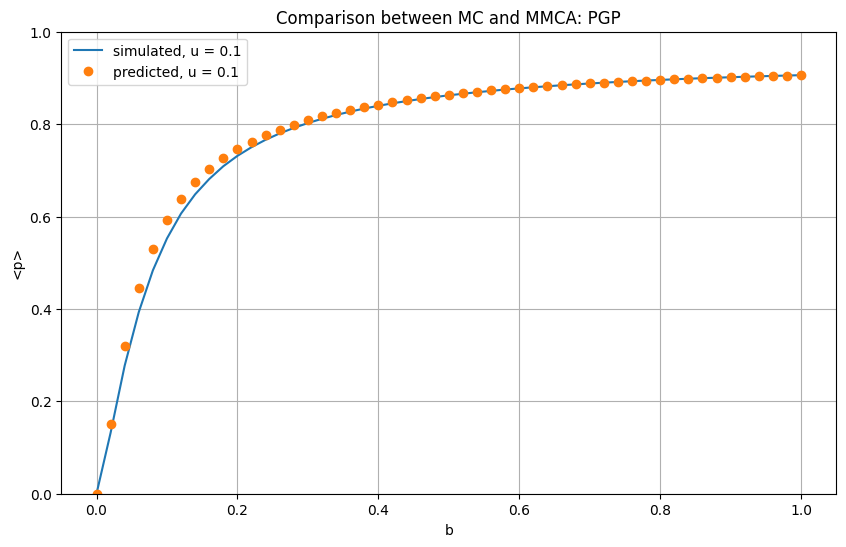

In [47]:
plot_comparison(dict_PGP, MMCA_PGP, u_list, 'PGP')

###Network : RB125

In [18]:
path='/content/drive/MyDrive/A4_Networks/rb125.net'
rb125=nx.read_pajek(path)
rb125=nx.convert_node_labels_to_integers(rb125)

####SIS Combinations

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))
<ipython-input-4-9248a98dba0e>:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(10,6))


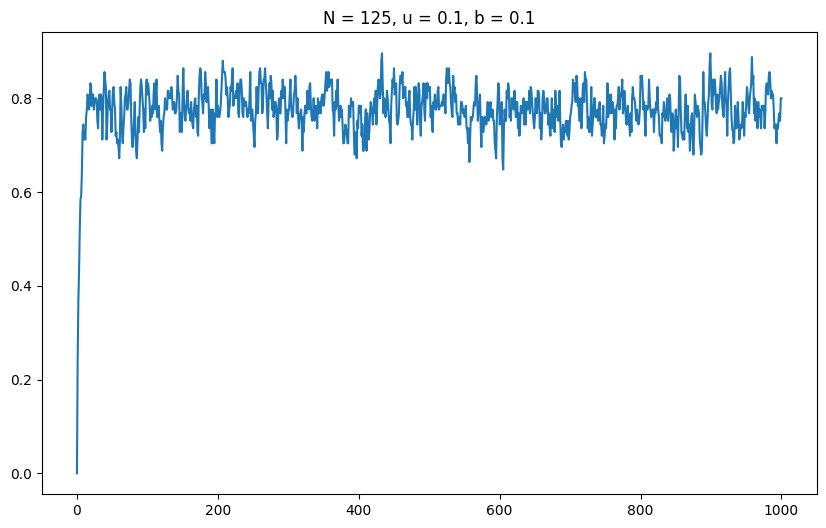

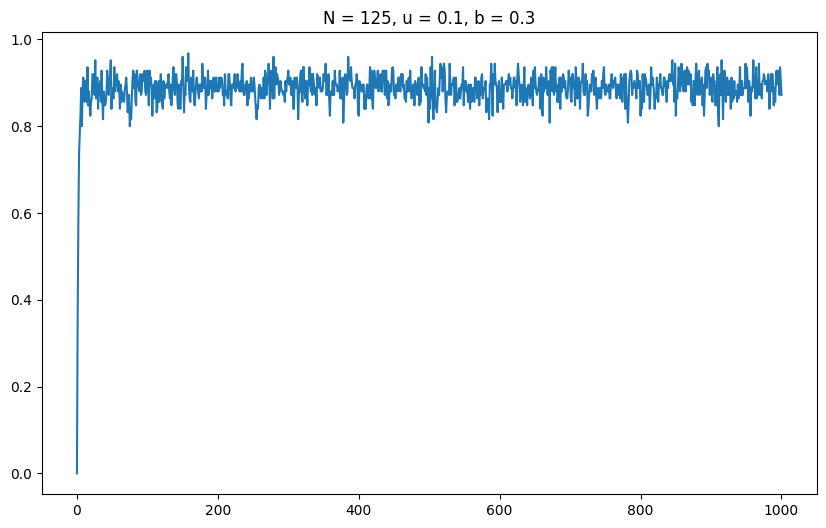

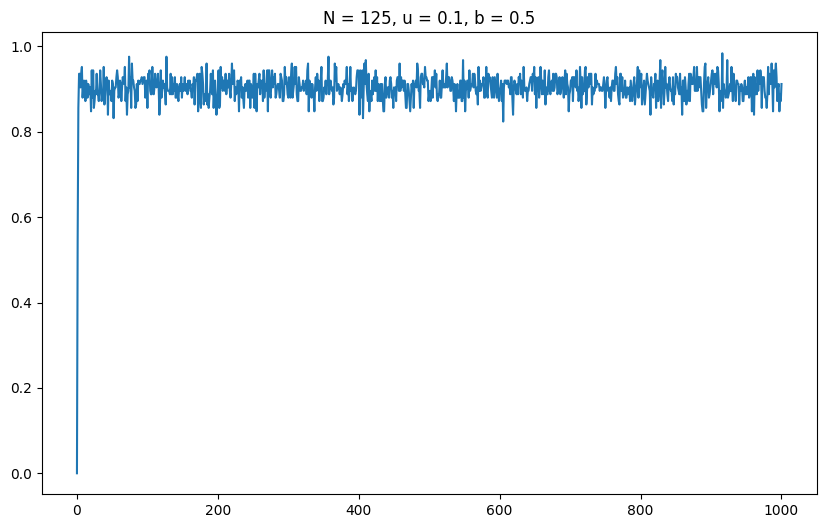

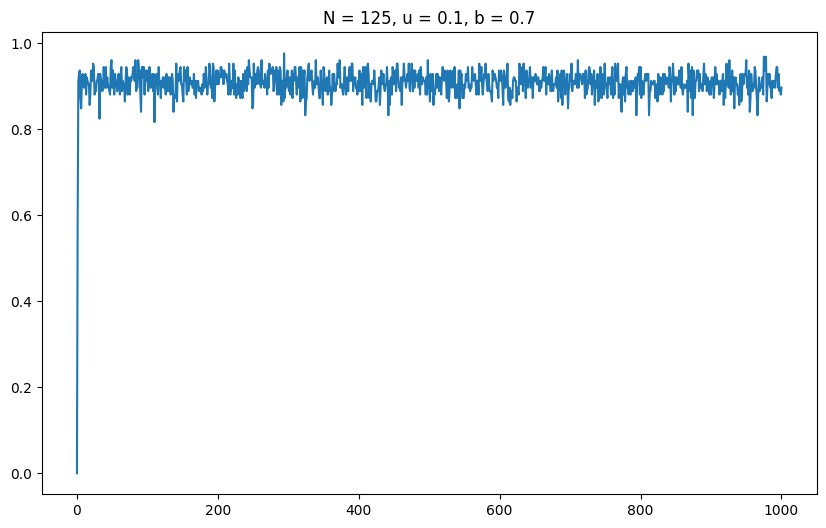

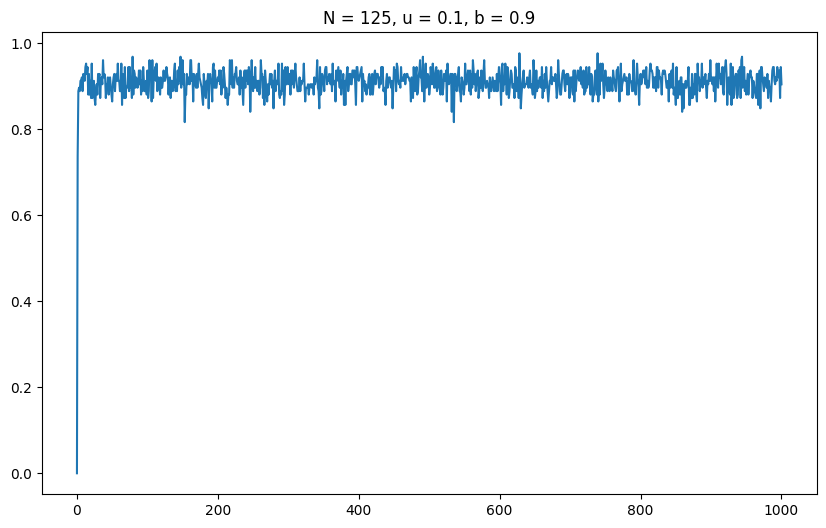

...

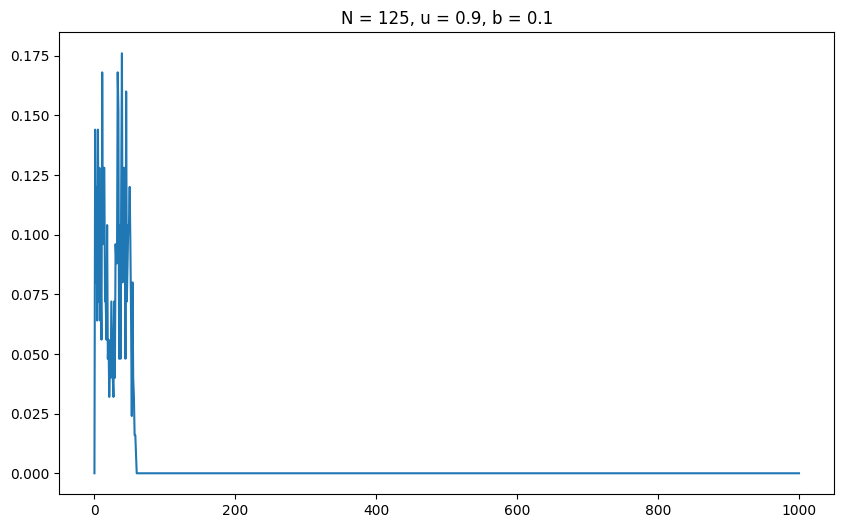

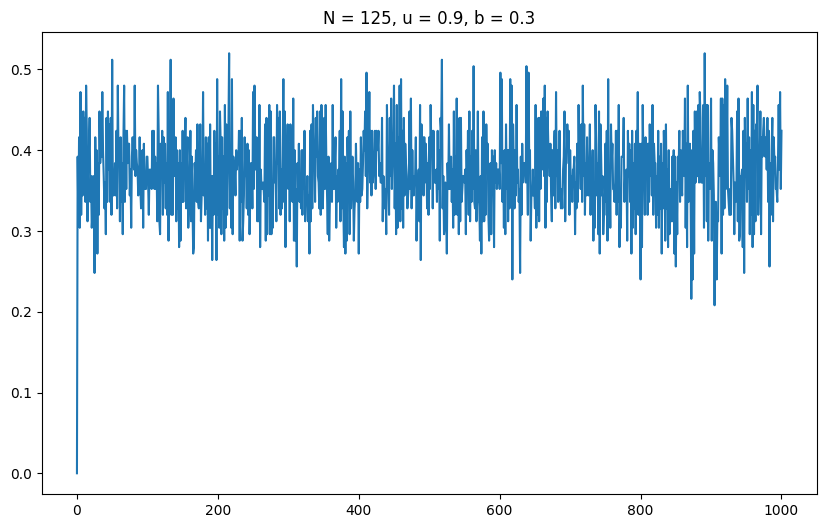

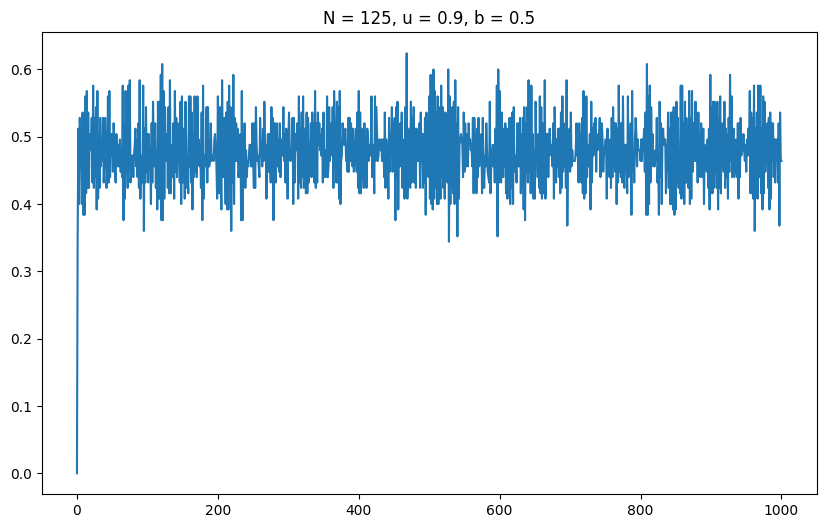

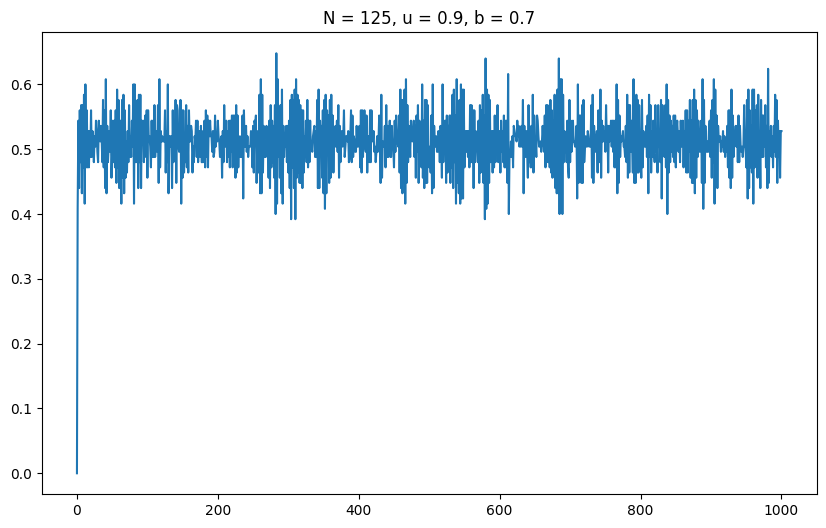

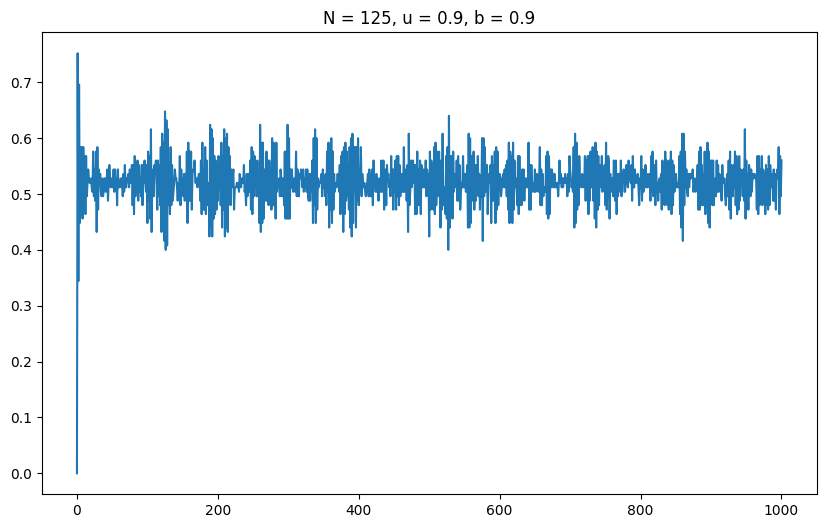

In [19]:
Ttrans=900
Tmax=1000
u_list = [0.1, 0.3, 0.5, 0.7, 0.9]
for u in u_list:
    for b in [0.1, 0.3, 0.5, 0.7, 0.9]:
        SIS(rb125, u, b, plot_time=True)

In [32]:
u_list = [0.1, 0.5,  0.9]


####MC Simulation for the network

<ipython-input-4-9248a98dba0e>:7: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  inf_0 = set(rd.sample(sus, n_p_0))


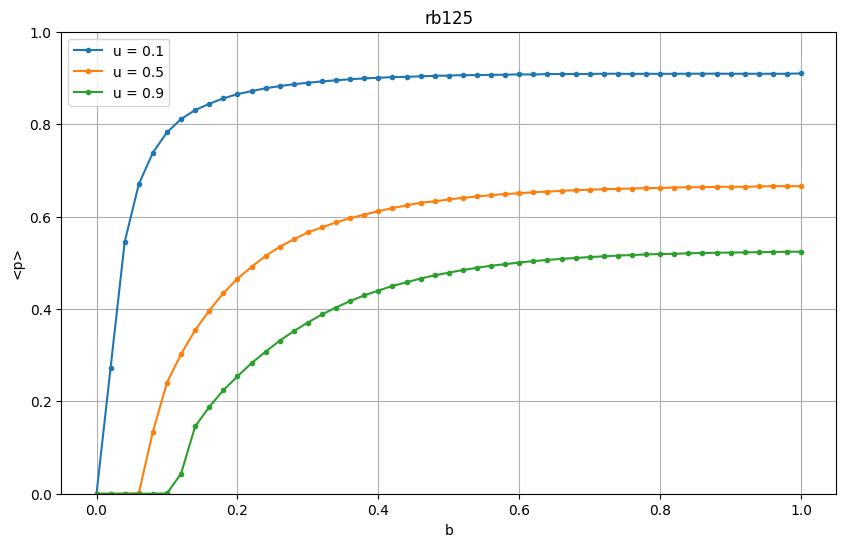

In [21]:
Ttrans = 200
Tmax = 300
Nrep = 50

dict_rb125 = plots(rb125,'rb125', u_list)

####Comparison MC & MMCA

In [22]:
MMCA_rb125 = MMCA_combinations(rb125, u_list)

       u     b  simulation    prediction
0    0.1  0.00    0.000000  8.959107e-21
1    0.1  0.02    0.272743  3.105607e-01
2    0.1  0.04    0.544980  5.690512e-01
3    0.1  0.06    0.669798  6.841808e-01
4    0.1  0.08    0.738317  7.469241e-01
..   ...   ...         ...           ...
148  0.9  0.92    0.522308  5.174606e-01
149  0.9  0.94    0.522855  5.183555e-01
150  0.9  0.96    0.523139  5.191706e-01
151  0.9  0.98    0.523842  5.199122e-01
152  0.9  1.00    0.523822  5.205864e-01

[153 rows x 4 columns]


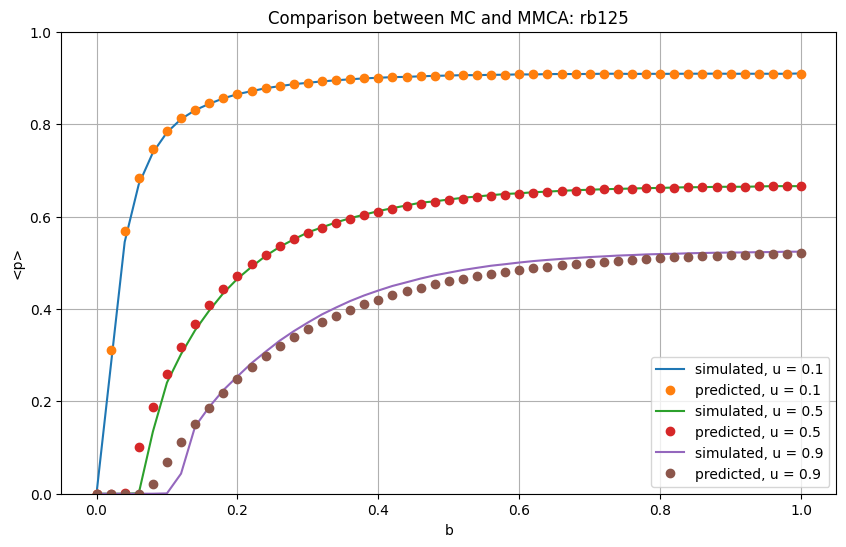

In [23]:
plot_comparison(dict_rb125, MMCA_rb125, u_list, 'rb125')